# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

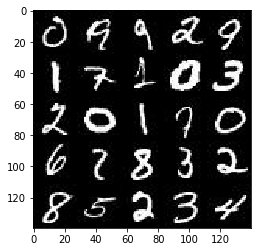

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

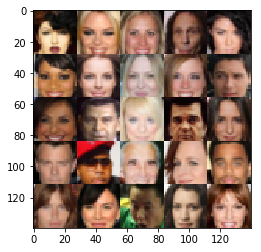

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(dtype=tf.float32, 
                                shape=(None, image_width, image_height, image_channels), 
                                name='input_real') 
    input_z = tf.placeholder(dtype=tf.float32, 
                             shape=(None, z_dim), 
                             name='input_z')
    lr = tf.placeholder(dtype=tf.float32, 
                        name='learning_rate')

    return (input_real, input_z, lr)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        alpha = 0.2
        
        # Input layer is 28x28x3
        conv1 = tf.layers.conv2d(inputs=images, 
                                 filters=64, 
                                 kernel_size=5, 
                                 strides=2, 
                                 padding='same')
        relu1 = tf.maximum(conv1*alpha, conv1)
        # 14x14x64
        
        conv2 = tf.layers.conv2d(inputs=relu1, 
                                 filters=512, 
                                 kernel_size=5, 
                                 strides=2, 
                                 padding='same')
        norm2 = tf.layers.batch_normalization(conv2, training=True)
        relu2 = tf.maximum(norm2*alpha, norm2)
        # 7x7x512

        # Flatten it
        flat = tf.reshape(relu2, (-1, 7*7*512))
        logits = tf.layers.dense(flat, 1)
        output = tf.sigmoid(logits)

    return (output, logits)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        
        alpha = 0.2
        
        # First fully connected layer
        fc = tf.layers.dense(z, 7*7*512)
        
        # Reshape it to start the convolutional stack
        fc = tf.reshape(fc, (-1, 7, 7, 512))
        fc = tf.layers.batch_normalization(fc, training=is_train)
        fc = tf.maximum(fc*alpha, fc)
        # 7x7x512
        
        h1 = tf.layers.conv2d_transpose(inputs=fc, 
                                        filters=64, 
                                        kernel_size=5, 
                                        strides=2, 
                                        padding='same')
        h1 = tf.layers.batch_normalization(h1, training=is_train)
        h1 = tf.maximum(h1*alpha, h1)
        # 14x14x64
        
        # Output layer
        logits = tf.layers.conv2d_transpose(inputs=h1, 
                                            filters=out_channel_dim, 
                                            kernel_size=5, 
                                            strides=2, 
                                            padding='same')
        # 28x28x3
        
        output = tf.tanh(logits)
        
        return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
import numpy as np

def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    # One Sided Label Smoothing for Discriminator loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                labels=tf.ones_like(d_model_real)*np.random.uniform(0.7, 1.0)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                labels=tf.ones_like(d_model_fake)*np.random.uniform(0.0, 0.3)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return (d_loss, g_loss)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return (d_train_opt, g_train_opt)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    #tf.reset_default_graph()
    
    image_width = data_shape[1]
    image_height = data_shape[2]
    image_channels = data_shape[3]
    (input_real, input_z, lr) = model_inputs(image_width, 
                                             image_height, 
                                             image_channels, 
                                             z_dim)
    
    (d_loss, g_loss) = model_loss(input_real, 
                                  input_z, 
                                  image_channels)
    
    (d_train_opt, g_train_opt) = model_opt(d_loss, 
                                           g_loss, 
                                           lr, 
                                           beta1)
    
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # normalize input
                batch_images *= 2.0
                
                # Sample random noise for Generator
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                feed_dict = {input_real : batch_images, 
                             input_z : batch_z,
                             lr : learning_rate}
                
                _ = sess.run(d_train_opt, feed_dict=feed_dict)
                _ = sess.run(g_train_opt, feed_dict=feed_dict)
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_d_loss = d_loss.eval(feed_dict)
                    train_g_loss = g_loss.eval(feed_dict)
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_d_loss),
                          "Generator Loss: {:.4f}".format(train_g_loss))
                
                if steps % 100 == 0:
                    n_images = 25
                    show_generator_output(sess, n_images, input_z, image_channels, data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 4.0970... Generator Loss: 0.1061
Epoch 1/2... Discriminator Loss: 13.2336... Generator Loss: 0.0001
Epoch 1/2... Discriminator Loss: 6.4597... Generator Loss: 0.0081
Epoch 1/2... Discriminator Loss: 5.4420... Generator Loss: 0.0153
Epoch 1/2... Discriminator Loss: 2.9358... Generator Loss: 0.1022
Epoch 1/2... Discriminator Loss: 2.2816... Generator Loss: 0.1973
Epoch 1/2... Discriminator Loss: 3.6998... Generator Loss: 0.0618
Epoch 1/2... Discriminator Loss: 2.0258... Generator Loss: 0.2563
Epoch 1/2... Discriminator Loss: 1.2074... Generator Loss: 1.1764
Epoch 1/2... Discriminator Loss: 1.5274... Generator Loss: 0.6347


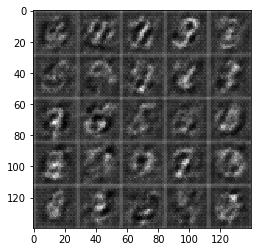

Epoch 1/2... Discriminator Loss: 1.8388... Generator Loss: 0.3006
Epoch 1/2... Discriminator Loss: 1.7087... Generator Loss: 0.3810
Epoch 1/2... Discriminator Loss: 1.6581... Generator Loss: 0.7629
Epoch 1/2... Discriminator Loss: 1.7268... Generator Loss: 0.4499
Epoch 1/2... Discriminator Loss: 1.5153... Generator Loss: 1.4013
Epoch 1/2... Discriminator Loss: 1.1771... Generator Loss: 0.8059
Epoch 1/2... Discriminator Loss: 2.0489... Generator Loss: 0.2153
Epoch 1/2... Discriminator Loss: 1.2309... Generator Loss: 0.7866
Epoch 1/2... Discriminator Loss: 1.5485... Generator Loss: 1.5492
Epoch 1/2... Discriminator Loss: 2.1669... Generator Loss: 0.1938


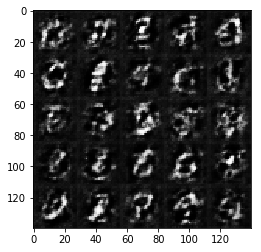

Epoch 1/2... Discriminator Loss: 1.5145... Generator Loss: 1.3908
Epoch 1/2... Discriminator Loss: 1.3229... Generator Loss: 0.8013
Epoch 1/2... Discriminator Loss: 1.5480... Generator Loss: 0.4405
Epoch 1/2... Discriminator Loss: 2.1944... Generator Loss: 0.1910
Epoch 1/2... Discriminator Loss: 1.6975... Generator Loss: 0.3343
Epoch 1/2... Discriminator Loss: 1.9379... Generator Loss: 0.2681
Epoch 1/2... Discriminator Loss: 1.4749... Generator Loss: 1.6230
Epoch 1/2... Discriminator Loss: 1.3207... Generator Loss: 1.3463
Epoch 1/2... Discriminator Loss: 1.0444... Generator Loss: 1.1305
Epoch 1/2... Discriminator Loss: 37.1012... Generator Loss: 0.0002


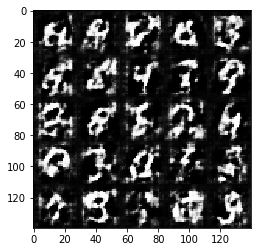

Epoch 1/2... Discriminator Loss: 19.8169... Generator Loss: 0.0001
Epoch 1/2... Discriminator Loss: 4.0832... Generator Loss: 0.0346
Epoch 1/2... Discriminator Loss: 6.4714... Generator Loss: 0.0076
Epoch 1/2... Discriminator Loss: 4.7425... Generator Loss: 0.0245
Epoch 1/2... Discriminator Loss: 5.4963... Generator Loss: 0.0236
Epoch 1/2... Discriminator Loss: 1.7479... Generator Loss: 0.3387
Epoch 1/2... Discriminator Loss: 1.3275... Generator Loss: 0.9535
Epoch 1/2... Discriminator Loss: 1.3009... Generator Loss: 0.7660
Epoch 1/2... Discriminator Loss: 1.6975... Generator Loss: 1.4092
Epoch 1/2... Discriminator Loss: 1.3614... Generator Loss: 0.5950


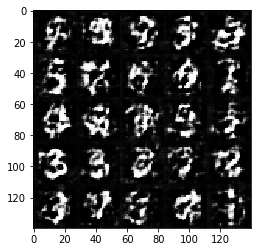

Epoch 1/2... Discriminator Loss: 1.2949... Generator Loss: 0.6621
Epoch 1/2... Discriminator Loss: 1.1821... Generator Loss: 0.8492
Epoch 1/2... Discriminator Loss: 1.6610... Generator Loss: 0.3541
Epoch 1/2... Discriminator Loss: 1.2272... Generator Loss: 0.7323
Epoch 1/2... Discriminator Loss: 1.3548... Generator Loss: 0.5458
Epoch 1/2... Discriminator Loss: 1.3413... Generator Loss: 0.5528
Epoch 1/2... Discriminator Loss: 1.5336... Generator Loss: 0.4322
Epoch 1/2... Discriminator Loss: 1.1798... Generator Loss: 0.7984
Epoch 1/2... Discriminator Loss: 1.2013... Generator Loss: 1.4202
Epoch 1/2... Discriminator Loss: 1.2491... Generator Loss: 1.2047


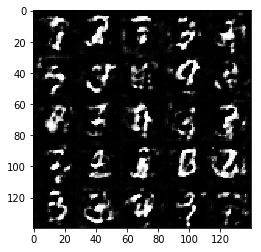

Epoch 1/2... Discriminator Loss: 9.3745... Generator Loss: 8.8363
Epoch 1/2... Discriminator Loss: 7.6885... Generator Loss: 0.0062
Epoch 1/2... Discriminator Loss: 1.4674... Generator Loss: 0.5494
Epoch 1/2... Discriminator Loss: 1.3173... Generator Loss: 0.8617
Epoch 1/2... Discriminator Loss: 1.3004... Generator Loss: 0.6620
Epoch 1/2... Discriminator Loss: 1.2156... Generator Loss: 0.7791
Epoch 1/2... Discriminator Loss: 1.4435... Generator Loss: 0.4828
Epoch 1/2... Discriminator Loss: 1.1357... Generator Loss: 0.9284
Epoch 1/2... Discriminator Loss: 1.4008... Generator Loss: 0.5586
Epoch 1/2... Discriminator Loss: 1.2103... Generator Loss: 1.2523


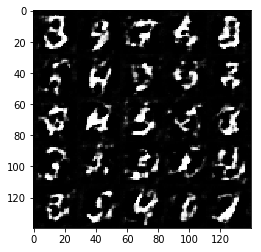

Epoch 1/2... Discriminator Loss: 1.2443... Generator Loss: 1.1062
Epoch 1/2... Discriminator Loss: 1.2316... Generator Loss: 1.5063
Epoch 1/2... Discriminator Loss: 1.3782... Generator Loss: 0.5400
Epoch 1/2... Discriminator Loss: 1.1124... Generator Loss: 1.0286
Epoch 1/2... Discriminator Loss: 1.2708... Generator Loss: 1.1343
Epoch 1/2... Discriminator Loss: 1.1775... Generator Loss: 0.8812
Epoch 1/2... Discriminator Loss: 1.2954... Generator Loss: 0.6562
Epoch 1/2... Discriminator Loss: 1.1386... Generator Loss: 1.2468
Epoch 1/2... Discriminator Loss: 1.1784... Generator Loss: 0.8501
Epoch 1/2... Discriminator Loss: 1.2212... Generator Loss: 0.8850


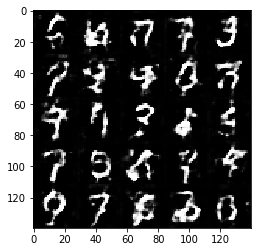

Epoch 1/2... Discriminator Loss: 1.5996... Generator Loss: 0.4043
Epoch 1/2... Discriminator Loss: 1.5950... Generator Loss: 0.4081
Epoch 1/2... Discriminator Loss: 1.1759... Generator Loss: 0.7662
Epoch 1/2... Discriminator Loss: 1.4582... Generator Loss: 0.4803
Epoch 1/2... Discriminator Loss: 1.1295... Generator Loss: 1.3397
Epoch 1/2... Discriminator Loss: 1.3412... Generator Loss: 0.5984
Epoch 1/2... Discriminator Loss: 1.7443... Generator Loss: 0.3783
Epoch 1/2... Discriminator Loss: 1.0722... Generator Loss: 1.4873
Epoch 1/2... Discriminator Loss: 1.2319... Generator Loss: 0.8034
Epoch 1/2... Discriminator Loss: 1.2010... Generator Loss: 1.1020


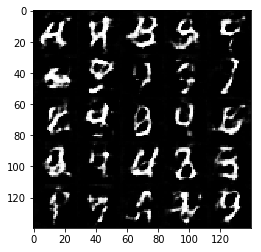

Epoch 1/2... Discriminator Loss: 1.3199... Generator Loss: 0.6175
Epoch 1/2... Discriminator Loss: 1.3620... Generator Loss: 0.5923
Epoch 1/2... Discriminator Loss: 1.0736... Generator Loss: 1.2352
Epoch 1/2... Discriminator Loss: 2.0124... Generator Loss: 0.9840
Epoch 1/2... Discriminator Loss: 1.4349... Generator Loss: 0.8988
Epoch 1/2... Discriminator Loss: 1.6992... Generator Loss: 0.3449
Epoch 1/2... Discriminator Loss: 1.1841... Generator Loss: 0.9279
Epoch 1/2... Discriminator Loss: 1.5493... Generator Loss: 0.4211
Epoch 1/2... Discriminator Loss: 1.1751... Generator Loss: 0.8535
Epoch 1/2... Discriminator Loss: 1.7877... Generator Loss: 0.3192


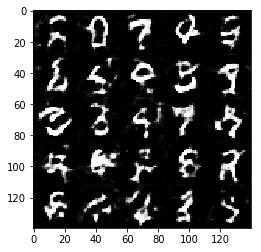

Epoch 1/2... Discriminator Loss: 1.4281... Generator Loss: 0.5043
Epoch 1/2... Discriminator Loss: 1.2107... Generator Loss: 0.8063
Epoch 1/2... Discriminator Loss: 1.5289... Generator Loss: 0.4415
Epoch 1/2... Discriminator Loss: 1.1512... Generator Loss: 1.0884
Epoch 1/2... Discriminator Loss: 1.2004... Generator Loss: 0.8192
Epoch 1/2... Discriminator Loss: 1.2290... Generator Loss: 0.8450
Epoch 1/2... Discriminator Loss: 1.3516... Generator Loss: 0.5793
Epoch 1/2... Discriminator Loss: 1.3132... Generator Loss: 0.6277
Epoch 1/2... Discriminator Loss: 1.1602... Generator Loss: 1.1360
Epoch 1/2... Discriminator Loss: 1.3563... Generator Loss: 1.1018


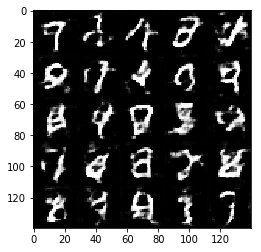

Epoch 1/2... Discriminator Loss: 1.5168... Generator Loss: 0.4341
Epoch 1/2... Discriminator Loss: 1.3058... Generator Loss: 0.8113
Epoch 1/2... Discriminator Loss: 1.6452... Generator Loss: 1.6778
Epoch 1/2... Discriminator Loss: 1.4343... Generator Loss: 0.5465
Epoch 1/2... Discriminator Loss: 1.2149... Generator Loss: 0.8036
Epoch 1/2... Discriminator Loss: 1.4964... Generator Loss: 0.4618
Epoch 1/2... Discriminator Loss: 1.2519... Generator Loss: 0.7508
Epoch 1/2... Discriminator Loss: 1.3138... Generator Loss: 0.8115
Epoch 1/2... Discriminator Loss: 1.4367... Generator Loss: 0.4925
Epoch 1/2... Discriminator Loss: 1.5392... Generator Loss: 0.4186


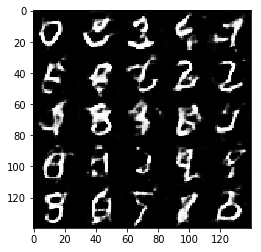

Epoch 1/2... Discriminator Loss: 1.2077... Generator Loss: 0.9658
Epoch 1/2... Discriminator Loss: 2.0339... Generator Loss: 0.2617
Epoch 1/2... Discriminator Loss: 5.8378... Generator Loss: 0.0146
Epoch 1/2... Discriminator Loss: 6.5603... Generator Loss: 5.4893
Epoch 1/2... Discriminator Loss: 2.1051... Generator Loss: 0.9975
Epoch 1/2... Discriminator Loss: 1.4874... Generator Loss: 0.9809
Epoch 1/2... Discriminator Loss: 1.2749... Generator Loss: 0.7768
Epoch 1/2... Discriminator Loss: 1.2091... Generator Loss: 1.0296
Epoch 1/2... Discriminator Loss: 1.2923... Generator Loss: 0.8415
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 1.1281


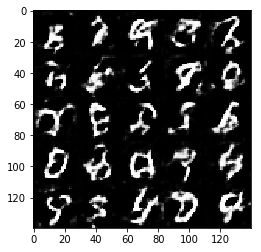

Epoch 1/2... Discriminator Loss: 1.3072... Generator Loss: 0.6529
Epoch 1/2... Discriminator Loss: 1.4282... Generator Loss: 0.5201
Epoch 1/2... Discriminator Loss: 1.4887... Generator Loss: 0.4737
Epoch 1/2... Discriminator Loss: 1.8484... Generator Loss: 0.2868
Epoch 1/2... Discriminator Loss: 1.2272... Generator Loss: 1.0619
Epoch 1/2... Discriminator Loss: 1.4270... Generator Loss: 0.5298
Epoch 1/2... Discriminator Loss: 1.1397... Generator Loss: 0.8992
Epoch 1/2... Discriminator Loss: 1.7296... Generator Loss: 0.3649
Epoch 1/2... Discriminator Loss: 1.3971... Generator Loss: 0.5244
Epoch 1/2... Discriminator Loss: 1.4224... Generator Loss: 0.5082


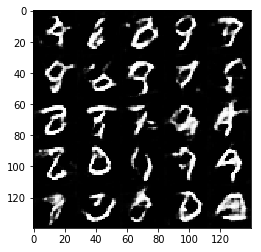

Epoch 1/2... Discriminator Loss: 1.3470... Generator Loss: 0.6048
Epoch 1/2... Discriminator Loss: 1.3542... Generator Loss: 0.8317
Epoch 1/2... Discriminator Loss: 1.5801... Generator Loss: 0.4124
Epoch 1/2... Discriminator Loss: 1.5339... Generator Loss: 1.4739
Epoch 1/2... Discriminator Loss: 1.2564... Generator Loss: 0.6850
Epoch 1/2... Discriminator Loss: 1.1986... Generator Loss: 0.9462
Epoch 1/2... Discriminator Loss: 1.2320... Generator Loss: 0.7765
Epoch 1/2... Discriminator Loss: 1.1475... Generator Loss: 1.1687
Epoch 1/2... Discriminator Loss: 1.2178... Generator Loss: 0.7860
Epoch 1/2... Discriminator Loss: 1.3338... Generator Loss: 0.5784


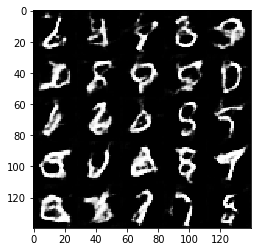

Epoch 1/2... Discriminator Loss: 1.2827... Generator Loss: 0.6681
Epoch 1/2... Discriminator Loss: 1.3550... Generator Loss: 0.6515
Epoch 1/2... Discriminator Loss: 1.6758... Generator Loss: 0.3609
Epoch 1/2... Discriminator Loss: 1.1470... Generator Loss: 1.2148
Epoch 1/2... Discriminator Loss: 1.2177... Generator Loss: 1.0033
Epoch 1/2... Discriminator Loss: 1.3638... Generator Loss: 1.0856
Epoch 1/2... Discriminator Loss: 1.2526... Generator Loss: 1.0115
Epoch 1/2... Discriminator Loss: 1.1707... Generator Loss: 1.2011
Epoch 1/2... Discriminator Loss: 1.1866... Generator Loss: 0.9108
Epoch 1/2... Discriminator Loss: 2.1954... Generator Loss: 0.2074


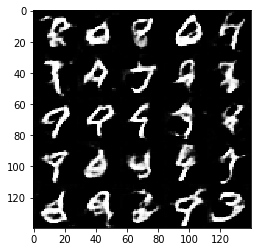

Epoch 1/2... Discriminator Loss: 5.5026... Generator Loss: 0.0163
Epoch 1/2... Discriminator Loss: 1.7124... Generator Loss: 1.6253
Epoch 1/2... Discriminator Loss: 1.3527... Generator Loss: 0.6162
Epoch 1/2... Discriminator Loss: 1.2671... Generator Loss: 0.7459
Epoch 1/2... Discriminator Loss: 1.4090... Generator Loss: 0.5460
Epoch 1/2... Discriminator Loss: 1.2244... Generator Loss: 1.0837
Epoch 1/2... Discriminator Loss: 1.3792... Generator Loss: 0.5713
Epoch 1/2... Discriminator Loss: 1.3054... Generator Loss: 0.6525
Epoch 1/2... Discriminator Loss: 1.2331... Generator Loss: 1.1105
Epoch 1/2... Discriminator Loss: 1.2804... Generator Loss: 0.6819


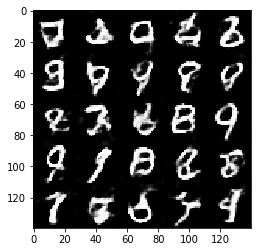

Epoch 1/2... Discriminator Loss: 1.2840... Generator Loss: 1.2539
Epoch 1/2... Discriminator Loss: 1.4735... Generator Loss: 0.4911
Epoch 1/2... Discriminator Loss: 1.2637... Generator Loss: 0.6990
Epoch 1/2... Discriminator Loss: 1.2040... Generator Loss: 0.7696
Epoch 1/2... Discriminator Loss: 1.2470... Generator Loss: 0.7269
Epoch 1/2... Discriminator Loss: 1.5110... Generator Loss: 0.4449
Epoch 1/2... Discriminator Loss: 1.0997... Generator Loss: 1.0658
Epoch 1/2... Discriminator Loss: 1.2658... Generator Loss: 1.8227
Epoch 1/2... Discriminator Loss: 1.1996... Generator Loss: 0.8073
Epoch 1/2... Discriminator Loss: 1.9002... Generator Loss: 0.2692


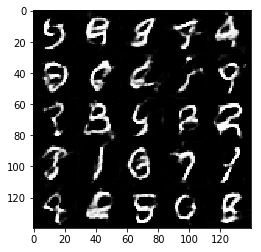

Epoch 1/2... Discriminator Loss: 1.7938... Generator Loss: 0.3200
Epoch 1/2... Discriminator Loss: 1.5646... Generator Loss: 0.4206
Epoch 1/2... Discriminator Loss: 1.8754... Generator Loss: 0.2861
Epoch 1/2... Discriminator Loss: 1.2388... Generator Loss: 0.8326
Epoch 1/2... Discriminator Loss: 1.2047... Generator Loss: 0.8118
Epoch 1/2... Discriminator Loss: 1.3096... Generator Loss: 1.6260
Epoch 1/2... Discriminator Loss: 1.2729... Generator Loss: 0.6577
Epoch 1/2... Discriminator Loss: 1.3821... Generator Loss: 0.5370
Epoch 1/2... Discriminator Loss: 1.3001... Generator Loss: 0.8106
Epoch 1/2... Discriminator Loss: 1.1948... Generator Loss: 0.9483


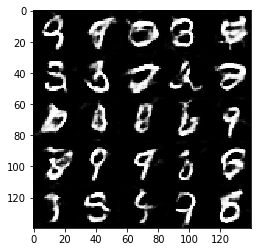

Epoch 1/2... Discriminator Loss: 1.2253... Generator Loss: 0.7871
Epoch 1/2... Discriminator Loss: 1.2295... Generator Loss: 0.7887
Epoch 1/2... Discriminator Loss: 1.5791... Generator Loss: 0.4350
Epoch 1/2... Discriminator Loss: 1.1882... Generator Loss: 0.7911
Epoch 1/2... Discriminator Loss: 1.3563... Generator Loss: 1.5809
Epoch 1/2... Discriminator Loss: 1.3618... Generator Loss: 0.5884
Epoch 1/2... Discriminator Loss: 1.2555... Generator Loss: 0.7629
Epoch 1/2... Discriminator Loss: 1.9099... Generator Loss: 0.2842
Epoch 1/2... Discriminator Loss: 1.6582... Generator Loss: 0.3812
Epoch 1/2... Discriminator Loss: 2.1688... Generator Loss: 0.2127


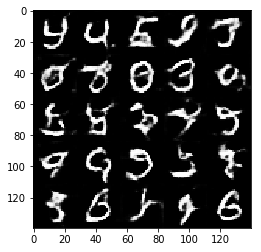

Epoch 1/2... Discriminator Loss: 1.4409... Generator Loss: 0.5095
Epoch 1/2... Discriminator Loss: 1.3432... Generator Loss: 1.1358
Epoch 1/2... Discriminator Loss: 1.3095... Generator Loss: 0.7742
Epoch 1/2... Discriminator Loss: 1.2718... Generator Loss: 0.7487
Epoch 1/2... Discriminator Loss: 1.5946... Generator Loss: 1.7076
Epoch 1/2... Discriminator Loss: 1.2159... Generator Loss: 1.1741
Epoch 1/2... Discriminator Loss: 1.2139... Generator Loss: 0.9433
Epoch 1/2... Discriminator Loss: 1.2191... Generator Loss: 1.1693
Epoch 1/2... Discriminator Loss: 1.2538... Generator Loss: 0.8051
Epoch 1/2... Discriminator Loss: 1.5025... Generator Loss: 0.4576


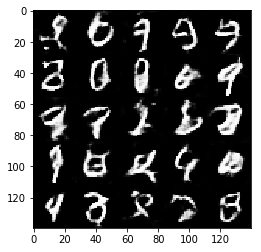

Epoch 1/2... Discriminator Loss: 1.2954... Generator Loss: 0.6444
Epoch 1/2... Discriminator Loss: 1.3574... Generator Loss: 0.6348
Epoch 1/2... Discriminator Loss: 1.9079... Generator Loss: 0.2869
Epoch 1/2... Discriminator Loss: 2.2732... Generator Loss: 0.1935
Epoch 1/2... Discriminator Loss: 11.5012... Generator Loss: 0.0002
Epoch 1/2... Discriminator Loss: 5.3383... Generator Loss: 0.0241
Epoch 1/2... Discriminator Loss: 4.9353... Generator Loss: 0.0222
Epoch 1/2... Discriminator Loss: 2.8859... Generator Loss: 0.1228
Epoch 1/2... Discriminator Loss: 1.7869... Generator Loss: 0.3764
Epoch 1/2... Discriminator Loss: 1.5132... Generator Loss: 0.4443


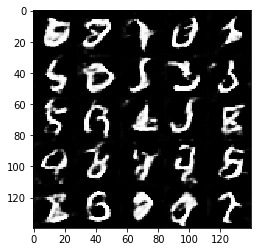

Epoch 1/2... Discriminator Loss: 1.4752... Generator Loss: 0.5111
Epoch 1/2... Discriminator Loss: 1.5375... Generator Loss: 1.8515
Epoch 1/2... Discriminator Loss: 1.3537... Generator Loss: 0.6437
Epoch 1/2... Discriminator Loss: 1.2886... Generator Loss: 0.7478
Epoch 1/2... Discriminator Loss: 1.5588... Generator Loss: 0.4415
Epoch 1/2... Discriminator Loss: 1.2147... Generator Loss: 0.7488
Epoch 1/2... Discriminator Loss: 1.2118... Generator Loss: 1.1668
Epoch 1/2... Discriminator Loss: 1.2824... Generator Loss: 0.6895
Epoch 1/2... Discriminator Loss: 1.2629... Generator Loss: 0.6865
Epoch 1/2... Discriminator Loss: 1.2969... Generator Loss: 0.9276


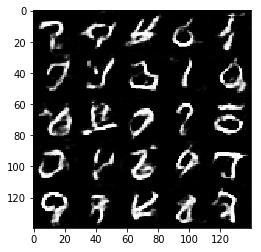

Epoch 1/2... Discriminator Loss: 1.1643... Generator Loss: 1.1544
Epoch 1/2... Discriminator Loss: 1.2429... Generator Loss: 0.8300
Epoch 1/2... Discriminator Loss: 1.1794... Generator Loss: 0.9945
Epoch 1/2... Discriminator Loss: 1.5006... Generator Loss: 0.4526
Epoch 1/2... Discriminator Loss: 1.5658... Generator Loss: 0.4085
Epoch 1/2... Discriminator Loss: 1.2517... Generator Loss: 0.7370
Epoch 1/2... Discriminator Loss: 1.1778... Generator Loss: 1.0728
Epoch 1/2... Discriminator Loss: 1.4894... Generator Loss: 0.4700
Epoch 1/2... Discriminator Loss: 1.3290... Generator Loss: 1.1984
Epoch 1/2... Discriminator Loss: 1.1710... Generator Loss: 1.1597


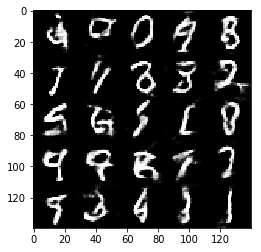

Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 0.7451
Epoch 1/2... Discriminator Loss: 1.1825... Generator Loss: 0.9543
Epoch 1/2... Discriminator Loss: 2.3770... Generator Loss: 3.0536
Epoch 1/2... Discriminator Loss: 4.0501... Generator Loss: 3.4316
Epoch 1/2... Discriminator Loss: 1.3987... Generator Loss: 0.7359
Epoch 1/2... Discriminator Loss: 1.5081... Generator Loss: 0.4912
Epoch 1/2... Discriminator Loss: 1.4643... Generator Loss: 0.5042
Epoch 1/2... Discriminator Loss: 1.2290... Generator Loss: 0.7592
Epoch 1/2... Discriminator Loss: 1.2509... Generator Loss: 1.1835
Epoch 1/2... Discriminator Loss: 1.2800... Generator Loss: 0.6320


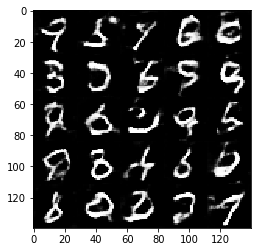

Epoch 1/2... Discriminator Loss: 1.2819... Generator Loss: 0.6701
Epoch 1/2... Discriminator Loss: 1.3813... Generator Loss: 0.5794
Epoch 1/2... Discriminator Loss: 1.2431... Generator Loss: 0.9598
Epoch 1/2... Discriminator Loss: 1.1299... Generator Loss: 1.1514
Epoch 1/2... Discriminator Loss: 1.2884... Generator Loss: 0.7984
Epoch 1/2... Discriminator Loss: 1.1918... Generator Loss: 0.8838
Epoch 1/2... Discriminator Loss: 1.1579... Generator Loss: 0.9372
Epoch 1/2... Discriminator Loss: 1.2100... Generator Loss: 1.0003
Epoch 1/2... Discriminator Loss: 1.4711... Generator Loss: 0.4905
Epoch 1/2... Discriminator Loss: 1.5761... Generator Loss: 0.4381


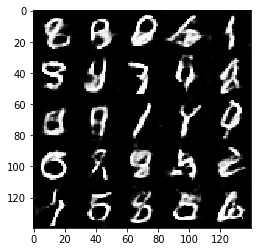

Epoch 1/2... Discriminator Loss: 1.5114... Generator Loss: 0.4319
Epoch 1/2... Discriminator Loss: 1.2199... Generator Loss: 0.7385
Epoch 1/2... Discriminator Loss: 1.1155... Generator Loss: 1.0359
Epoch 1/2... Discriminator Loss: 1.5923... Generator Loss: 0.3988
Epoch 1/2... Discriminator Loss: 1.3227... Generator Loss: 0.6626
Epoch 1/2... Discriminator Loss: 1.1803... Generator Loss: 0.7894
Epoch 1/2... Discriminator Loss: 1.3175... Generator Loss: 0.6705
Epoch 1/2... Discriminator Loss: 1.4967... Generator Loss: 2.1545
Epoch 1/2... Discriminator Loss: 1.2754... Generator Loss: 0.6828
Epoch 1/2... Discriminator Loss: 1.1133... Generator Loss: 1.0733


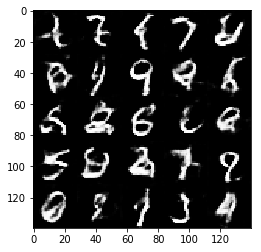

Epoch 1/2... Discriminator Loss: 1.8364... Generator Loss: 0.2993
Epoch 1/2... Discriminator Loss: 1.1744... Generator Loss: 1.1409
Epoch 1/2... Discriminator Loss: 1.5508... Generator Loss: 0.4448
Epoch 1/2... Discriminator Loss: 1.2368... Generator Loss: 0.9433
Epoch 1/2... Discriminator Loss: 1.4190... Generator Loss: 0.5284
Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 0.8231
Epoch 1/2... Discriminator Loss: 1.1758... Generator Loss: 1.1938
Epoch 1/2... Discriminator Loss: 1.1385... Generator Loss: 1.1169
Epoch 1/2... Discriminator Loss: 1.2393... Generator Loss: 0.8125
Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 0.7886


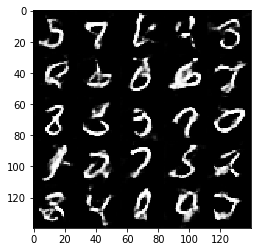

Epoch 1/2... Discriminator Loss: 1.1601... Generator Loss: 1.1728
Epoch 1/2... Discriminator Loss: 1.2197... Generator Loss: 0.8024
Epoch 1/2... Discriminator Loss: 1.3491... Generator Loss: 1.3289
Epoch 1/2... Discriminator Loss: 1.3031... Generator Loss: 1.1612
Epoch 1/2... Discriminator Loss: 1.2593... Generator Loss: 0.6993
Epoch 1/2... Discriminator Loss: 1.2409... Generator Loss: 0.9922
Epoch 1/2... Discriminator Loss: 1.3082... Generator Loss: 0.6287
Epoch 1/2... Discriminator Loss: 1.3708... Generator Loss: 0.5611
Epoch 1/2... Discriminator Loss: 1.1258... Generator Loss: 1.4268
Epoch 1/2... Discriminator Loss: 1.2058... Generator Loss: 1.3784


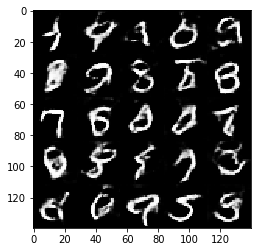

Epoch 1/2... Discriminator Loss: 1.3169... Generator Loss: 1.6006
Epoch 1/2... Discriminator Loss: 1.2863... Generator Loss: 0.7334
Epoch 1/2... Discriminator Loss: 4.0382... Generator Loss: 0.0510
Epoch 1/2... Discriminator Loss: 3.4351... Generator Loss: 0.1083
Epoch 1/2... Discriminator Loss: 1.6109... Generator Loss: 0.4951
Epoch 1/2... Discriminator Loss: 1.2445... Generator Loss: 1.1483
Epoch 1/2... Discriminator Loss: 1.5843... Generator Loss: 0.4491
Epoch 1/2... Discriminator Loss: 1.3510... Generator Loss: 0.6505
Epoch 1/2... Discriminator Loss: 1.2323... Generator Loss: 0.8342
Epoch 1/2... Discriminator Loss: 1.2862... Generator Loss: 0.6754


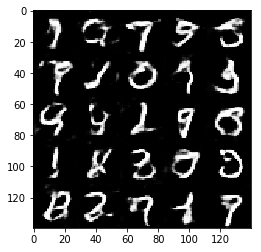

Epoch 1/2... Discriminator Loss: 1.1337... Generator Loss: 0.9139
Epoch 1/2... Discriminator Loss: 1.5758... Generator Loss: 0.4200
Epoch 1/2... Discriminator Loss: 1.1477... Generator Loss: 0.8561
Epoch 1/2... Discriminator Loss: 1.2667... Generator Loss: 0.8330
Epoch 1/2... Discriminator Loss: 1.2332... Generator Loss: 0.7443
Epoch 1/2... Discriminator Loss: 1.0878... Generator Loss: 1.1188
Epoch 1/2... Discriminator Loss: 1.2968... Generator Loss: 1.5768
Epoch 1/2... Discriminator Loss: 1.1763... Generator Loss: 1.0178
Epoch 1/2... Discriminator Loss: 1.1608... Generator Loss: 1.1073
Epoch 1/2... Discriminator Loss: 1.1770... Generator Loss: 0.7694


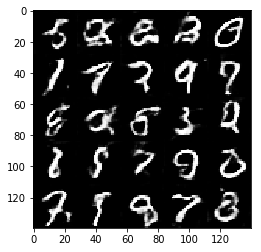

Epoch 2/2... Discriminator Loss: 1.1723... Generator Loss: 0.8589
Epoch 2/2... Discriminator Loss: 1.2204... Generator Loss: 0.7058
Epoch 2/2... Discriminator Loss: 1.1960... Generator Loss: 0.8137
Epoch 2/2... Discriminator Loss: 1.2097... Generator Loss: 0.7639
Epoch 2/2... Discriminator Loss: 1.5533... Generator Loss: 0.5093
Epoch 2/2... Discriminator Loss: 1.6710... Generator Loss: 0.3555
Epoch 2/2... Discriminator Loss: 1.2269... Generator Loss: 0.7663
Epoch 2/2... Discriminator Loss: 1.5203... Generator Loss: 0.5011
Epoch 2/2... Discriminator Loss: 1.2725... Generator Loss: 0.7514
Epoch 2/2... Discriminator Loss: 1.1628... Generator Loss: 0.9477


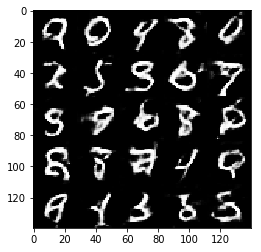

Epoch 2/2... Discriminator Loss: 1.1136... Generator Loss: 1.1019
Epoch 2/2... Discriminator Loss: 1.7203... Generator Loss: 0.3620
Epoch 2/2... Discriminator Loss: 2.0024... Generator Loss: 0.2464
Epoch 2/2... Discriminator Loss: 1.7598... Generator Loss: 0.3340
Epoch 2/2... Discriminator Loss: 1.4000... Generator Loss: 0.5345
Epoch 2/2... Discriminator Loss: 1.1286... Generator Loss: 1.0216
Epoch 2/2... Discriminator Loss: 1.6559... Generator Loss: 0.3893
Epoch 2/2... Discriminator Loss: 1.6319... Generator Loss: 0.3868
Epoch 2/2... Discriminator Loss: 1.2910... Generator Loss: 0.7713
Epoch 2/2... Discriminator Loss: 1.1018... Generator Loss: 0.9899


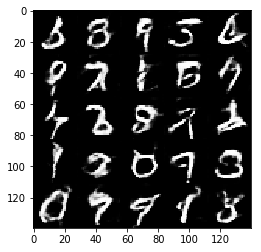

Epoch 2/2... Discriminator Loss: 1.4193... Generator Loss: 1.6402
Epoch 2/2... Discriminator Loss: 1.6186... Generator Loss: 0.3918
Epoch 2/2... Discriminator Loss: 1.1005... Generator Loss: 1.1245
Epoch 2/2... Discriminator Loss: 1.4065... Generator Loss: 0.5203
Epoch 2/2... Discriminator Loss: 1.5412... Generator Loss: 0.4123
Epoch 2/2... Discriminator Loss: 1.2954... Generator Loss: 0.6506
Epoch 2/2... Discriminator Loss: 1.1826... Generator Loss: 0.9492
Epoch 2/2... Discriminator Loss: 1.5776... Generator Loss: 0.4045
Epoch 2/2... Discriminator Loss: 1.3270... Generator Loss: 0.6466
Epoch 2/2... Discriminator Loss: 1.0829... Generator Loss: 1.1991


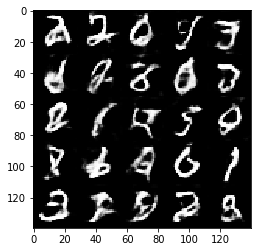

Epoch 2/2... Discriminator Loss: 2.4934... Generator Loss: 3.0734
Epoch 2/2... Discriminator Loss: 5.3412... Generator Loss: 5.3970
Epoch 2/2... Discriminator Loss: 1.6158... Generator Loss: 1.2900
Epoch 2/2... Discriminator Loss: 1.2366... Generator Loss: 0.9419
Epoch 2/2... Discriminator Loss: 1.5073... Generator Loss: 0.5046
Epoch 2/2... Discriminator Loss: 1.2779... Generator Loss: 0.6572
Epoch 2/2... Discriminator Loss: 1.1770... Generator Loss: 1.0973
Epoch 2/2... Discriminator Loss: 1.1082... Generator Loss: 1.1245
Epoch 2/2... Discriminator Loss: 1.1938... Generator Loss: 0.7904
Epoch 2/2... Discriminator Loss: 1.1805... Generator Loss: 1.0566


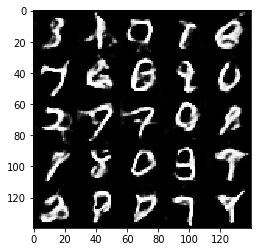

Epoch 2/2... Discriminator Loss: 1.1480... Generator Loss: 1.4703
Epoch 2/2... Discriminator Loss: 1.1620... Generator Loss: 0.8759
Epoch 2/2... Discriminator Loss: 1.0811... Generator Loss: 1.1348
Epoch 2/2... Discriminator Loss: 1.0961... Generator Loss: 1.2064
Epoch 2/2... Discriminator Loss: 1.5024... Generator Loss: 0.4794
Epoch 2/2... Discriminator Loss: 1.1443... Generator Loss: 1.3482
Epoch 2/2... Discriminator Loss: 1.4098... Generator Loss: 0.5127
Epoch 2/2... Discriminator Loss: 1.1525... Generator Loss: 1.4456
Epoch 2/2... Discriminator Loss: 1.3167... Generator Loss: 0.6078
Epoch 2/2... Discriminator Loss: 1.1886... Generator Loss: 1.1933


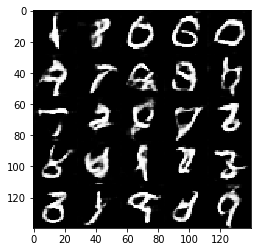

Epoch 2/2... Discriminator Loss: 1.2310... Generator Loss: 0.8562
Epoch 2/2... Discriminator Loss: 1.3046... Generator Loss: 0.6413
Epoch 2/2... Discriminator Loss: 1.4631... Generator Loss: 0.5554
Epoch 2/2... Discriminator Loss: 1.3115... Generator Loss: 0.6001
Epoch 2/2... Discriminator Loss: 1.6832... Generator Loss: 0.3900
Epoch 2/2... Discriminator Loss: 1.1360... Generator Loss: 1.0085
Epoch 2/2... Discriminator Loss: 1.3463... Generator Loss: 0.6138
Epoch 2/2... Discriminator Loss: 1.6936... Generator Loss: 0.3705
Epoch 2/2... Discriminator Loss: 1.6270... Generator Loss: 0.4325
Epoch 2/2... Discriminator Loss: 1.3427... Generator Loss: 0.7018


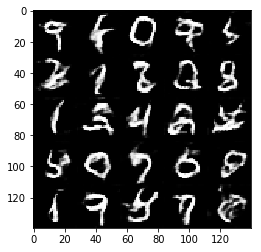

Epoch 2/2... Discriminator Loss: 1.8896... Generator Loss: 0.3004
Epoch 2/2... Discriminator Loss: 1.7795... Generator Loss: 0.3481
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 1.3565
Epoch 2/2... Discriminator Loss: 1.2481... Generator Loss: 1.5945
Epoch 2/2... Discriminator Loss: 1.9416... Generator Loss: 0.3084
Epoch 2/2... Discriminator Loss: 1.2624... Generator Loss: 0.6667
Epoch 2/2... Discriminator Loss: 1.1169... Generator Loss: 0.9561
Epoch 2/2... Discriminator Loss: 1.2768... Generator Loss: 0.6496
Epoch 2/2... Discriminator Loss: 1.2672... Generator Loss: 1.6759
Epoch 2/2... Discriminator Loss: 1.2038... Generator Loss: 1.2796


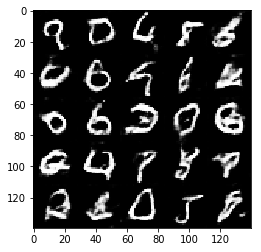

Epoch 2/2... Discriminator Loss: 1.2366... Generator Loss: 0.7411
Epoch 2/2... Discriminator Loss: 1.2100... Generator Loss: 1.6775
Epoch 2/2... Discriminator Loss: 1.0847... Generator Loss: 1.0212
Epoch 2/2... Discriminator Loss: 1.5326... Generator Loss: 0.5226
Epoch 2/2... Discriminator Loss: 1.3477... Generator Loss: 1.8543
Epoch 2/2... Discriminator Loss: 1.5756... Generator Loss: 0.4381
Epoch 2/2... Discriminator Loss: 1.7099... Generator Loss: 0.3539
Epoch 2/2... Discriminator Loss: 1.1007... Generator Loss: 1.0148
Epoch 2/2... Discriminator Loss: 1.4384... Generator Loss: 2.0858
Epoch 2/2... Discriminator Loss: 1.3166... Generator Loss: 0.6503


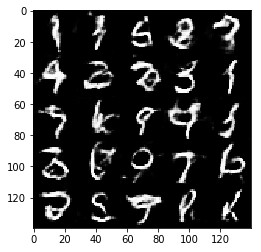

Epoch 2/2... Discriminator Loss: 1.2551... Generator Loss: 0.7534
Epoch 2/2... Discriminator Loss: 1.4025... Generator Loss: 0.5803
Epoch 2/2... Discriminator Loss: 1.1054... Generator Loss: 1.0288
Epoch 2/2... Discriminator Loss: 1.3454... Generator Loss: 0.6568
Epoch 2/2... Discriminator Loss: 1.2552... Generator Loss: 0.6814
Epoch 2/2... Discriminator Loss: 1.1961... Generator Loss: 0.7798
Epoch 2/2... Discriminator Loss: 1.0639... Generator Loss: 1.1128
Epoch 2/2... Discriminator Loss: 2.5066... Generator Loss: 0.1703
Epoch 2/2... Discriminator Loss: 1.3105... Generator Loss: 0.6510
Epoch 2/2... Discriminator Loss: 1.2140... Generator Loss: 1.2336


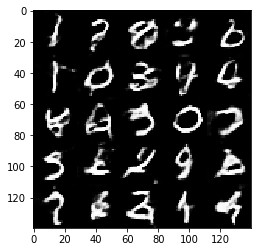

Epoch 2/2... Discriminator Loss: 1.1353... Generator Loss: 1.3102
Epoch 2/2... Discriminator Loss: 1.2716... Generator Loss: 0.6598
Epoch 2/2... Discriminator Loss: 1.1136... Generator Loss: 1.0471
Epoch 2/2... Discriminator Loss: 1.2235... Generator Loss: 0.7842
Epoch 2/2... Discriminator Loss: 1.1739... Generator Loss: 0.9045
Epoch 2/2... Discriminator Loss: 3.3744... Generator Loss: 4.1053
Epoch 2/2... Discriminator Loss: 2.8780... Generator Loss: 2.4114
Epoch 2/2... Discriminator Loss: 1.2245... Generator Loss: 1.0126
Epoch 2/2... Discriminator Loss: 1.2203... Generator Loss: 1.3551
Epoch 2/2... Discriminator Loss: 1.2425... Generator Loss: 0.8623


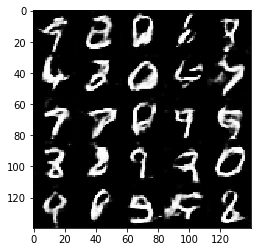

Epoch 2/2... Discriminator Loss: 1.2051... Generator Loss: 1.0110
Epoch 2/2... Discriminator Loss: 1.2370... Generator Loss: 0.7226
Epoch 2/2... Discriminator Loss: 1.1572... Generator Loss: 0.9660
Epoch 2/2... Discriminator Loss: 1.2000... Generator Loss: 0.7836
Epoch 2/2... Discriminator Loss: 1.4246... Generator Loss: 0.5563
Epoch 2/2... Discriminator Loss: 1.4264... Generator Loss: 0.4994
Epoch 2/2... Discriminator Loss: 1.3452... Generator Loss: 0.5877
Epoch 2/2... Discriminator Loss: 1.1426... Generator Loss: 0.8465
Epoch 2/2... Discriminator Loss: 1.3342... Generator Loss: 0.6533
Epoch 2/2... Discriminator Loss: 1.1677... Generator Loss: 1.1938


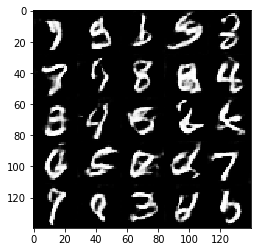

Epoch 2/2... Discriminator Loss: 1.3126... Generator Loss: 0.6418
Epoch 2/2... Discriminator Loss: 1.6796... Generator Loss: 0.3829
Epoch 2/2... Discriminator Loss: 1.1297... Generator Loss: 1.8790
Epoch 2/2... Discriminator Loss: 1.1043... Generator Loss: 0.9096
Epoch 2/2... Discriminator Loss: 1.1959... Generator Loss: 0.7639
Epoch 2/2... Discriminator Loss: 1.6358... Generator Loss: 0.3899
Epoch 2/2... Discriminator Loss: 1.6493... Generator Loss: 0.3839
Epoch 2/2... Discriminator Loss: 1.2655... Generator Loss: 0.7228
Epoch 2/2... Discriminator Loss: 1.8383... Generator Loss: 0.3247
Epoch 2/2... Discriminator Loss: 1.4993... Generator Loss: 0.4911


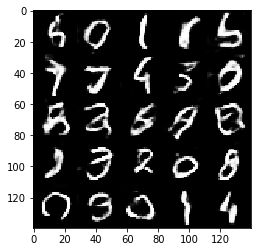

Epoch 2/2... Discriminator Loss: 1.4606... Generator Loss: 0.4902
Epoch 2/2... Discriminator Loss: 1.1750... Generator Loss: 0.9154
Epoch 2/2... Discriminator Loss: 1.0815... Generator Loss: 1.3792
Epoch 2/2... Discriminator Loss: 1.3142... Generator Loss: 0.9948
Epoch 2/2... Discriminator Loss: 1.1334... Generator Loss: 0.8441
Epoch 2/2... Discriminator Loss: 1.2432... Generator Loss: 0.6954
Epoch 2/2... Discriminator Loss: 1.8369... Generator Loss: 0.3180
Epoch 2/2... Discriminator Loss: 2.0322... Generator Loss: 0.2485
Epoch 2/2... Discriminator Loss: 1.6478... Generator Loss: 0.4144
Epoch 2/2... Discriminator Loss: 1.4572... Generator Loss: 0.4871


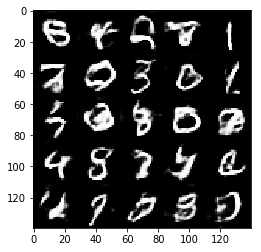

Epoch 2/2... Discriminator Loss: 1.2842... Generator Loss: 0.6292
Epoch 2/2... Discriminator Loss: 1.1989... Generator Loss: 1.4767
Epoch 2/2... Discriminator Loss: 1.4076... Generator Loss: 0.5684
Epoch 2/2... Discriminator Loss: 1.1741... Generator Loss: 0.8947
Epoch 2/2... Discriminator Loss: 1.3361... Generator Loss: 0.6077
Epoch 2/2... Discriminator Loss: 1.7059... Generator Loss: 0.3667
Epoch 2/2... Discriminator Loss: 1.4432... Generator Loss: 0.4874
Epoch 2/2... Discriminator Loss: 1.4977... Generator Loss: 0.4909
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 1.2731
Epoch 2/2... Discriminator Loss: 1.1955... Generator Loss: 0.8031


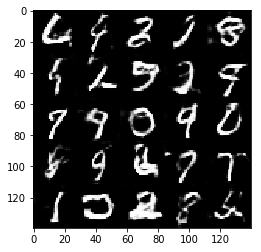

Epoch 2/2... Discriminator Loss: 1.7783... Generator Loss: 0.3610
Epoch 2/2... Discriminator Loss: 1.1187... Generator Loss: 1.1770
Epoch 2/2... Discriminator Loss: 1.2854... Generator Loss: 1.0220
Epoch 2/2... Discriminator Loss: 1.1788... Generator Loss: 2.1484
Epoch 2/2... Discriminator Loss: 1.2120... Generator Loss: 1.7766
Epoch 2/2... Discriminator Loss: 1.3179... Generator Loss: 0.7187
Epoch 2/2... Discriminator Loss: 1.1773... Generator Loss: 0.8344
Epoch 2/2... Discriminator Loss: 1.1837... Generator Loss: 1.7405
Epoch 2/2... Discriminator Loss: 1.0394... Generator Loss: 1.0890
Epoch 2/2... Discriminator Loss: 2.1566... Generator Loss: 0.2322


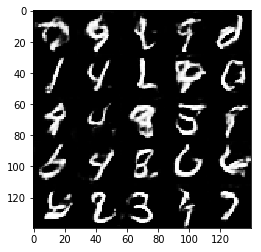

Epoch 2/2... Discriminator Loss: 1.1798... Generator Loss: 0.7790
Epoch 2/2... Discriminator Loss: 1.3931... Generator Loss: 0.5378
Epoch 2/2... Discriminator Loss: 1.9418... Generator Loss: 0.3059
Epoch 2/2... Discriminator Loss: 1.3919... Generator Loss: 0.6120
Epoch 2/2... Discriminator Loss: 1.2127... Generator Loss: 0.7508
Epoch 2/2... Discriminator Loss: 1.0892... Generator Loss: 0.8922
Epoch 2/2... Discriminator Loss: 1.4502... Generator Loss: 2.2383
Epoch 2/2... Discriminator Loss: 1.1181... Generator Loss: 0.9732
Epoch 2/2... Discriminator Loss: 1.1362... Generator Loss: 0.9413
Epoch 2/2... Discriminator Loss: 1.4343... Generator Loss: 0.5459


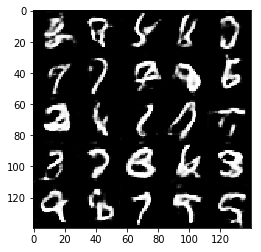

Epoch 2/2... Discriminator Loss: 1.2493... Generator Loss: 1.7628
Epoch 2/2... Discriminator Loss: 1.2095... Generator Loss: 0.7878
Epoch 2/2... Discriminator Loss: 1.1953... Generator Loss: 1.5563
Epoch 2/2... Discriminator Loss: 1.0319... Generator Loss: 1.3184
Epoch 2/2... Discriminator Loss: 1.2031... Generator Loss: 1.5757
Epoch 2/2... Discriminator Loss: 1.3945... Generator Loss: 0.5338
Epoch 2/2... Discriminator Loss: 1.2636... Generator Loss: 1.9635
Epoch 2/2... Discriminator Loss: 1.5626... Generator Loss: 2.2777
Epoch 2/2... Discriminator Loss: 1.8255... Generator Loss: 2.2030
Epoch 2/2... Discriminator Loss: 1.1956... Generator Loss: 0.7809


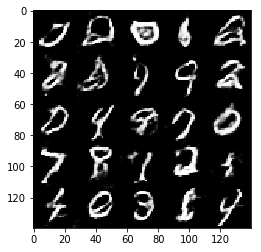

Epoch 2/2... Discriminator Loss: 1.4396... Generator Loss: 0.5467
Epoch 2/2... Discriminator Loss: 1.7078... Generator Loss: 0.3998
Epoch 2/2... Discriminator Loss: 1.4608... Generator Loss: 0.5257
Epoch 2/2... Discriminator Loss: 1.1066... Generator Loss: 0.9293
Epoch 2/2... Discriminator Loss: 1.3463... Generator Loss: 0.6090
Epoch 2/2... Discriminator Loss: 1.1319... Generator Loss: 1.6228
Epoch 2/2... Discriminator Loss: 1.0478... Generator Loss: 1.0031
Epoch 2/2... Discriminator Loss: 1.7568... Generator Loss: 0.3828
Epoch 2/2... Discriminator Loss: 1.5859... Generator Loss: 0.4304
Epoch 2/2... Discriminator Loss: 1.2492... Generator Loss: 0.6951


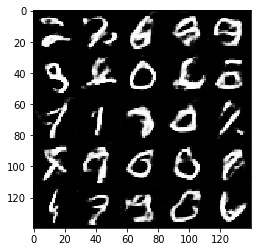

Epoch 2/2... Discriminator Loss: 1.1028... Generator Loss: 0.9464
Epoch 2/2... Discriminator Loss: 1.5254... Generator Loss: 2.3333
Epoch 2/2... Discriminator Loss: 1.8404... Generator Loss: 0.3555
Epoch 2/2... Discriminator Loss: 1.0626... Generator Loss: 1.0836
Epoch 2/2... Discriminator Loss: 1.1128... Generator Loss: 1.0769
Epoch 2/2... Discriminator Loss: 1.9279... Generator Loss: 0.3127
Epoch 2/2... Discriminator Loss: 1.9587... Generator Loss: 0.2877
Epoch 2/2... Discriminator Loss: 1.8149... Generator Loss: 0.3290
Epoch 2/2... Discriminator Loss: 1.1451... Generator Loss: 0.8554
Epoch 2/2... Discriminator Loss: 1.5053... Generator Loss: 0.4746


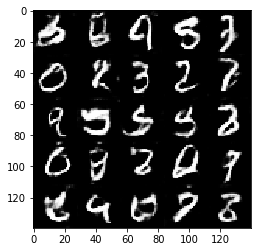

Epoch 2/2... Discriminator Loss: 1.4324... Generator Loss: 0.5166
Epoch 2/2... Discriminator Loss: 1.1495... Generator Loss: 0.9104
Epoch 2/2... Discriminator Loss: 1.1902... Generator Loss: 0.8937
Epoch 2/2... Discriminator Loss: 1.3244... Generator Loss: 0.6083
Epoch 2/2... Discriminator Loss: 1.1707... Generator Loss: 0.8173
Epoch 2/2... Discriminator Loss: 1.3797... Generator Loss: 0.5434
Epoch 2/2... Discriminator Loss: 1.0578... Generator Loss: 1.4960
Epoch 2/2... Discriminator Loss: 1.1476... Generator Loss: 1.3994
Epoch 2/2... Discriminator Loss: 1.1394... Generator Loss: 1.3221
Epoch 2/2... Discriminator Loss: 1.0818... Generator Loss: 1.1219


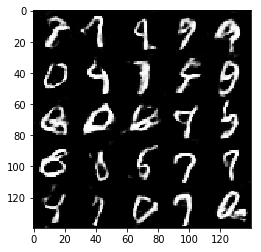

Epoch 2/2... Discriminator Loss: 1.3291... Generator Loss: 0.6066
Epoch 2/2... Discriminator Loss: 1.3205... Generator Loss: 0.7194
Epoch 2/2... Discriminator Loss: 1.1019... Generator Loss: 1.4909
Epoch 2/2... Discriminator Loss: 1.0874... Generator Loss: 1.2240
Epoch 2/2... Discriminator Loss: 1.1079... Generator Loss: 1.1319
Epoch 2/2... Discriminator Loss: 1.1038... Generator Loss: 0.9570
Epoch 2/2... Discriminator Loss: 1.0280... Generator Loss: 1.0860
Epoch 2/2... Discriminator Loss: 1.4017... Generator Loss: 0.5857
Epoch 2/2... Discriminator Loss: 1.2542... Generator Loss: 0.7270
Epoch 2/2... Discriminator Loss: 1.2207... Generator Loss: 1.8273


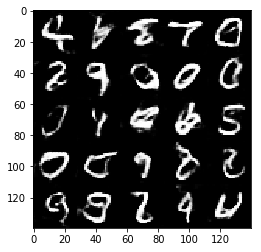

Epoch 2/2... Discriminator Loss: 0.9779... Generator Loss: 1.4106
Epoch 2/2... Discriminator Loss: 1.0694... Generator Loss: 0.9497
Epoch 2/2... Discriminator Loss: 1.2428... Generator Loss: 1.9991
Epoch 2/2... Discriminator Loss: 1.1657... Generator Loss: 1.5962
Epoch 2/2... Discriminator Loss: 1.8320... Generator Loss: 0.4110
Epoch 2/2... Discriminator Loss: 1.2930... Generator Loss: 0.6262
Epoch 2/2... Discriminator Loss: 1.1083... Generator Loss: 0.9912
Epoch 2/2... Discriminator Loss: 1.0960... Generator Loss: 1.3548
Epoch 2/2... Discriminator Loss: 1.3454... Generator Loss: 0.5832
Epoch 2/2... Discriminator Loss: 1.1596... Generator Loss: 1.5164


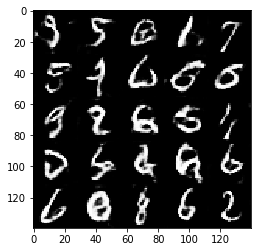

Epoch 2/2... Discriminator Loss: 2.1406... Generator Loss: 0.2505
Epoch 2/2... Discriminator Loss: 2.0963... Generator Loss: 0.2316
Epoch 2/2... Discriminator Loss: 1.0560... Generator Loss: 1.0662
Epoch 2/2... Discriminator Loss: 1.0784... Generator Loss: 0.9336
Epoch 2/2... Discriminator Loss: 2.1189... Generator Loss: 0.2282
Epoch 2/2... Discriminator Loss: 1.1862... Generator Loss: 1.9090
Epoch 2/2... Discriminator Loss: 1.0497... Generator Loss: 1.0235
Epoch 2/2... Discriminator Loss: 1.5416... Generator Loss: 0.4956
Epoch 2/2... Discriminator Loss: 1.0313... Generator Loss: 1.3065
Epoch 2/2... Discriminator Loss: 1.1510... Generator Loss: 0.8862


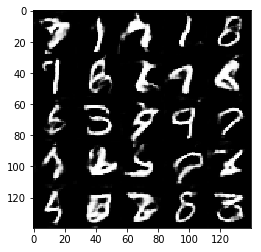

Epoch 2/2... Discriminator Loss: 1.4110... Generator Loss: 0.5447
Epoch 2/2... Discriminator Loss: 1.7120... Generator Loss: 0.3768
Epoch 2/2... Discriminator Loss: 1.1686... Generator Loss: 0.8444
Epoch 2/2... Discriminator Loss: 1.0412... Generator Loss: 1.6659
Epoch 2/2... Discriminator Loss: 1.2285... Generator Loss: 1.8085
Epoch 2/2... Discriminator Loss: 1.8030... Generator Loss: 0.3714
Epoch 2/2... Discriminator Loss: 1.1773... Generator Loss: 0.8405
Epoch 2/2... Discriminator Loss: 1.3670... Generator Loss: 2.9202
Epoch 2/2... Discriminator Loss: 2.0881... Generator Loss: 0.2477
Epoch 2/2... Discriminator Loss: 1.1594... Generator Loss: 1.9272


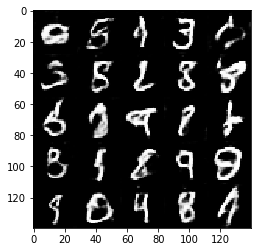

Epoch 2/2... Discriminator Loss: 1.1934... Generator Loss: 0.7861
Epoch 2/2... Discriminator Loss: 1.5418... Generator Loss: 0.4670
Epoch 2/2... Discriminator Loss: 1.6745... Generator Loss: 0.4235
Epoch 2/2... Discriminator Loss: 1.5338... Generator Loss: 0.5369
Epoch 2/2... Discriminator Loss: 1.7161... Generator Loss: 0.3991
Epoch 2/2... Discriminator Loss: 1.2051... Generator Loss: 0.7469
Epoch 2/2... Discriminator Loss: 1.1760... Generator Loss: 0.8208
Epoch 2/2... Discriminator Loss: 1.3427... Generator Loss: 0.5853
Epoch 2/2... Discriminator Loss: 1.8204... Generator Loss: 0.3494
Epoch 2/2... Discriminator Loss: 1.7014... Generator Loss: 0.5163


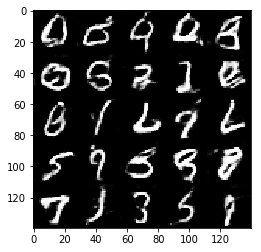

Epoch 2/2... Discriminator Loss: 1.7569... Generator Loss: 0.3357
Epoch 2/2... Discriminator Loss: 1.3672... Generator Loss: 0.5965
Epoch 2/2... Discriminator Loss: 1.4627... Generator Loss: 0.5050
Epoch 2/2... Discriminator Loss: 1.4865... Generator Loss: 0.4946
Epoch 2/2... Discriminator Loss: 1.0728... Generator Loss: 1.1435
Epoch 2/2... Discriminator Loss: 1.1995... Generator Loss: 0.7607
Epoch 2/2... Discriminator Loss: 1.1490... Generator Loss: 1.4835
Epoch 2/2... Discriminator Loss: 1.0785... Generator Loss: 1.0816
Epoch 2/2... Discriminator Loss: 1.3590... Generator Loss: 0.6230
Epoch 2/2... Discriminator Loss: 1.0591... Generator Loss: 1.1309


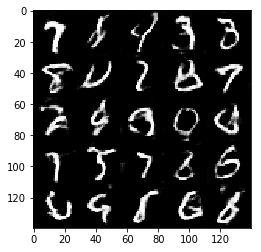

Epoch 2/2... Discriminator Loss: 1.1173... Generator Loss: 0.9055
Epoch 2/2... Discriminator Loss: 1.1002... Generator Loss: 1.5267
Epoch 2/2... Discriminator Loss: 1.3592... Generator Loss: 0.6086
Epoch 2/2... Discriminator Loss: 1.5506... Generator Loss: 0.4757
Epoch 2/2... Discriminator Loss: 1.1121... Generator Loss: 0.9266
Epoch 2/2... Discriminator Loss: 1.2732... Generator Loss: 1.7756
Epoch 2/2... Discriminator Loss: 1.4433... Generator Loss: 0.5308
Epoch 2/2... Discriminator Loss: 1.0018... Generator Loss: 1.2243
Epoch 2/2... Discriminator Loss: 1.0022... Generator Loss: 1.2915
Epoch 2/2... Discriminator Loss: 1.2124... Generator Loss: 0.7749


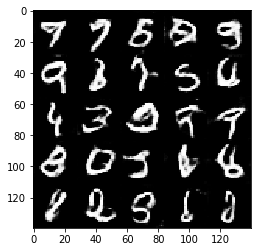

Epoch 2/2... Discriminator Loss: 1.2101... Generator Loss: 1.7894
Epoch 2/2... Discriminator Loss: 1.4266... Generator Loss: 1.6325
Epoch 2/2... Discriminator Loss: 0.9824... Generator Loss: 1.5036
Epoch 2/2... Discriminator Loss: 1.2036... Generator Loss: 1.8184
Epoch 2/2... Discriminator Loss: 1.4437... Generator Loss: 0.5235
Epoch 2/2... Discriminator Loss: 1.6030... Generator Loss: 0.4101
Epoch 2/2... Discriminator Loss: 1.1685... Generator Loss: 0.8133
Epoch 2/2... Discriminator Loss: 1.4339... Generator Loss: 0.6121
Epoch 2/2... Discriminator Loss: 1.0398... Generator Loss: 1.5527
Epoch 2/2... Discriminator Loss: 1.2406... Generator Loss: 0.7396


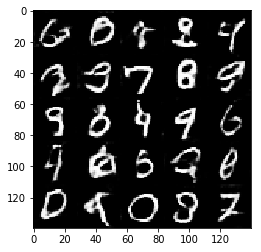

Epoch 2/2... Discriminator Loss: 1.1342... Generator Loss: 1.4940
Epoch 2/2... Discriminator Loss: 1.6631... Generator Loss: 0.4527
Epoch 2/2... Discriminator Loss: 1.2009... Generator Loss: 0.8376
Epoch 2/2... Discriminator Loss: 1.5488... Generator Loss: 0.4568
Epoch 2/2... Discriminator Loss: 1.4238... Generator Loss: 0.6080
Epoch 2/2... Discriminator Loss: 2.3037... Generator Loss: 0.2069
Epoch 2/2... Discriminator Loss: 1.5381... Generator Loss: 0.4992
Epoch 2/2... Discriminator Loss: 1.1989... Generator Loss: 0.7825
Epoch 2/2... Discriminator Loss: 1.5886... Generator Loss: 0.4730
Epoch 2/2... Discriminator Loss: 2.9078... Generator Loss: 0.1361


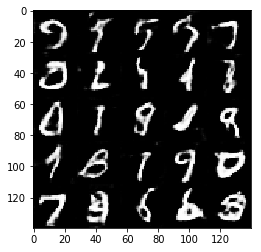

Epoch 2/2... Discriminator Loss: 2.4276... Generator Loss: 0.2166
Epoch 2/2... Discriminator Loss: 1.7975... Generator Loss: 0.3658
Epoch 2/2... Discriminator Loss: 1.4088... Generator Loss: 1.8395
Epoch 2/2... Discriminator Loss: 1.0882... Generator Loss: 1.1887
Epoch 2/2... Discriminator Loss: 1.1031... Generator Loss: 1.3959
Epoch 2/2... Discriminator Loss: 1.3931... Generator Loss: 0.5782
Epoch 2/2... Discriminator Loss: 1.1118... Generator Loss: 1.0343
Epoch 2/2... Discriminator Loss: 1.1539... Generator Loss: 1.2949
Epoch 2/2... Discriminator Loss: 1.1130... Generator Loss: 0.9434
Epoch 2/2... Discriminator Loss: 1.1159... Generator Loss: 0.8501


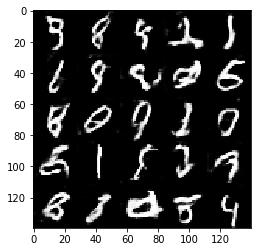

In [12]:
batch_size = 20
z_dim = 100
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 8.8189... Generator Loss: 0.0005
Epoch 1/1... Discriminator Loss: 3.5532... Generator Loss: 0.0206
Epoch 1/1... Discriminator Loss: 2.8408... Generator Loss: 0.0483
Epoch 1/1... Discriminator Loss: 2.5691... Generator Loss: 0.0943
Epoch 1/1... Discriminator Loss: 1.8720... Generator Loss: 0.1722
Epoch 1/1... Discriminator Loss: 1.6008... Generator Loss: 0.4220
Epoch 1/1... Discriminator Loss: 1.0900... Generator Loss: 1.1950
Epoch 1/1... Discriminator Loss: 1.4356... Generator Loss: 2.2629
Epoch 1/1... Discriminator Loss: 1.6755... Generator Loss: 0.2253
Epoch 1/1... Discriminator Loss: 1.3462... Generator Loss: 0.3903


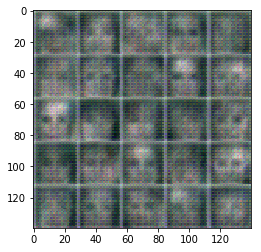

Epoch 1/1... Discriminator Loss: 1.4286... Generator Loss: 0.3531
Epoch 1/1... Discriminator Loss: 1.6242... Generator Loss: 0.3396
Epoch 1/1... Discriminator Loss: 1.9850... Generator Loss: 3.0762
Epoch 1/1... Discriminator Loss: 1.7004... Generator Loss: 0.4226
Epoch 1/1... Discriminator Loss: 1.4152... Generator Loss: 0.4669
Epoch 1/1... Discriminator Loss: 1.3871... Generator Loss: 0.4018
Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.4893
Epoch 1/1... Discriminator Loss: 1.7659... Generator Loss: 0.1992
Epoch 1/1... Discriminator Loss: 2.1126... Generator Loss: 0.1133
Epoch 1/1... Discriminator Loss: 6.2146... Generator Loss: 0.9154


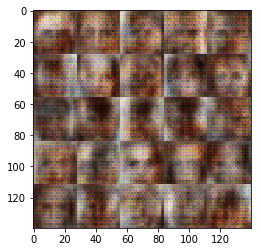

Epoch 1/1... Discriminator Loss: 4.7812... Generator Loss: 0.0205
Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.4044
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.5239
Epoch 1/1... Discriminator Loss: 1.3725... Generator Loss: 0.6861
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.4602
Epoch 1/1... Discriminator Loss: 1.5632... Generator Loss: 0.2780
Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.4923
Epoch 1/1... Discriminator Loss: 1.9457... Generator Loss: 0.8880


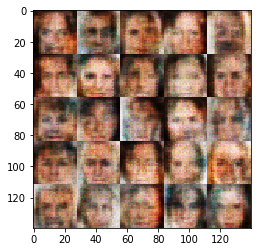

Epoch 1/1... Discriminator Loss: 3.4681... Generator Loss: 0.2924
Epoch 1/1... Discriminator Loss: 1.5082... Generator Loss: 0.4440
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.3986
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.5521
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.5129
Epoch 1/1... Discriminator Loss: 1.3457... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.3313... Generator Loss: 0.5714
Epoch 1/1... Discriminator Loss: 1.5043... Generator Loss: 0.2840
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.5011
Epoch 1/1... Discriminator Loss: 1.3413... Generator Loss: 0.4811


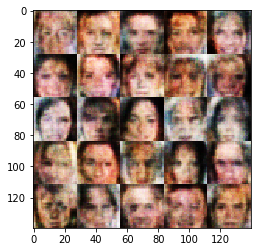

Epoch 1/1... Discriminator Loss: 1.5106... Generator Loss: 0.2836
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.3897
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.3999
Epoch 1/1... Discriminator Loss: 1.3355... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 1.5058... Generator Loss: 0.7240
Epoch 1/1... Discriminator Loss: 2.2499... Generator Loss: 0.1847
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.4586
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.4612
Epoch 1/1... Discriminator Loss: 1.3924... Generator Loss: 0.4702
Epoch 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.4792


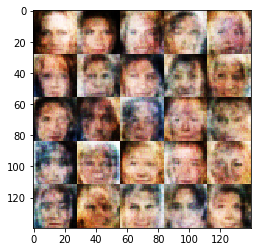

Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.5314
Epoch 1/1... Discriminator Loss: 1.3372... Generator Loss: 0.4989
Epoch 1/1... Discriminator Loss: 1.1774... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 8.3544... Generator Loss: 4.5050
Epoch 1/1... Discriminator Loss: 3.9893... Generator Loss: 0.2238
Epoch 1/1... Discriminator Loss: 2.7318... Generator Loss: 0.0860
Epoch 1/1... Discriminator Loss: 1.5392... Generator Loss: 0.2801
Epoch 1/1... Discriminator Loss: 1.6297... Generator Loss: 0.2408
Epoch 1/1... Discriminator Loss: 1.7953... Generator Loss: 0.1951
Epoch 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.4813


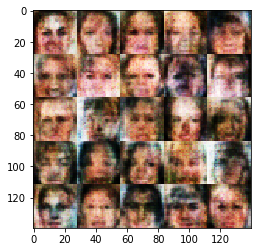

Epoch 1/1... Discriminator Loss: 1.2502... Generator Loss: 0.5895
Epoch 1/1... Discriminator Loss: 1.2158... Generator Loss: 0.8880
Epoch 1/1... Discriminator Loss: 1.5791... Generator Loss: 2.9719
Epoch 1/1... Discriminator Loss: 1.0436... Generator Loss: 1.1773
Epoch 1/1... Discriminator Loss: 1.5265... Generator Loss: 0.8354
Epoch 1/1... Discriminator Loss: 1.1929... Generator Loss: 1.1664
Epoch 1/1... Discriminator Loss: 1.5784... Generator Loss: 0.2491
Epoch 1/1... Discriminator Loss: 1.1679... Generator Loss: 1.7639
Epoch 1/1... Discriminator Loss: 2.2220... Generator Loss: 0.6846
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.7531


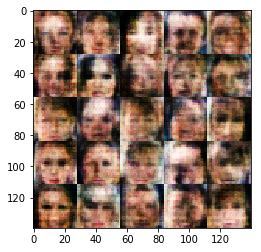

Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.3914
Epoch 1/1... Discriminator Loss: 1.2118... Generator Loss: 0.7120
Epoch 1/1... Discriminator Loss: 1.1016... Generator Loss: 1.1265
Epoch 1/1... Discriminator Loss: 1.2617... Generator Loss: 0.9982
Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 0.9950
Epoch 1/1... Discriminator Loss: 1.0549... Generator Loss: 1.3172
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 1.8727
Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.2872
Epoch 1/1... Discriminator Loss: 1.0326... Generator Loss: 1.0930
Epoch 1/1... Discriminator Loss: 3.1707... Generator Loss: 0.3000


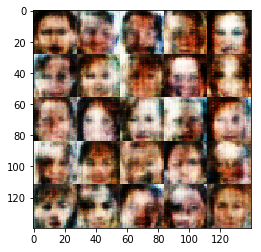

Epoch 1/1... Discriminator Loss: 1.9391... Generator Loss: 0.8550
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.5350
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.6097
Epoch 1/1... Discriminator Loss: 1.2734... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 1.1518... Generator Loss: 0.8912
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.8957
Epoch 1/1... Discriminator Loss: 1.4444... Generator Loss: 0.3296
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.0649... Generator Loss: 0.9190
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 1.6311


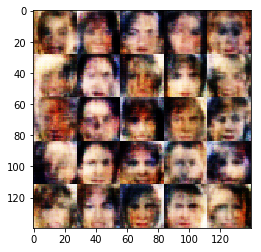

Epoch 1/1... Discriminator Loss: 1.1334... Generator Loss: 0.7917
Epoch 1/1... Discriminator Loss: 1.0516... Generator Loss: 0.9521
Epoch 1/1... Discriminator Loss: 1.1791... Generator Loss: 1.6806
Epoch 1/1... Discriminator Loss: 5.2135... Generator Loss: 2.1868
Epoch 1/1... Discriminator Loss: 2.9115... Generator Loss: 0.4512
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.4789
Epoch 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.4945
Epoch 1/1... Discriminator Loss: 1.3330... Generator Loss: 0.4510
Epoch 1/1... Discriminator Loss: 1.3265... Generator Loss: 0.4763
Epoch 1/1... Discriminator Loss: 1.3034... Generator Loss: 0.5352


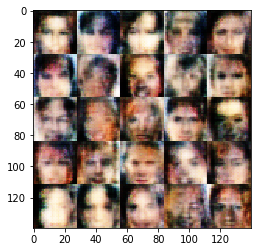

Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.4189
Epoch 1/1... Discriminator Loss: 1.4003... Generator Loss: 0.4039
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 0.4528
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 2.4441... Generator Loss: 1.5286
Epoch 1/1... Discriminator Loss: 4.9794... Generator Loss: 0.9236
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.4803
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.5100
Epoch 1/1... Discriminator Loss: 1.3222... Generator Loss: 0.5457
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.5099


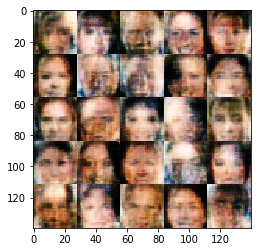

Epoch 1/1... Discriminator Loss: 1.2906... Generator Loss: 0.6025
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.5199
Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 0.5437
Epoch 1/1... Discriminator Loss: 1.3525... Generator Loss: 0.6041
Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.4146
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.7784
Epoch 1/1... Discriminator Loss: 1.6938... Generator Loss: 0.6293
Epoch 1/1... Discriminator Loss: 1.3308... Generator Loss: 0.5646
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.3107... Generator Loss: 0.6971


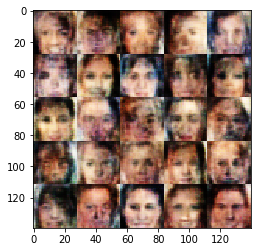

Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.4374
Epoch 1/1... Discriminator Loss: 1.2258... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.1635... Generator Loss: 0.9113
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.8802
Epoch 1/1... Discriminator Loss: 1.4874... Generator Loss: 0.9804
Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.6067
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.2325... Generator Loss: 0.7030
Epoch 1/1... Discriminator Loss: 1.6804... Generator Loss: 1.1094
Epoch 1/1... Discriminator Loss: 1.7873... Generator Loss: 0.8660


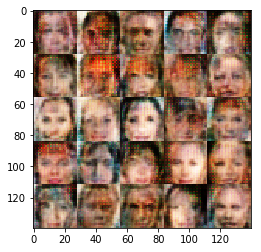

Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.4895
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.2832... Generator Loss: 0.6003
Epoch 1/1... Discriminator Loss: 1.1859... Generator Loss: 0.7481
Epoch 1/1... Discriminator Loss: 1.2780... Generator Loss: 0.5678
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.5039
Epoch 1/1... Discriminator Loss: 1.2672... Generator Loss: 0.5416
Epoch 1/1... Discriminator Loss: 1.4662... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 1.1549... Generator Loss: 0.8932
Epoch 1/1... Discriminator Loss: 1.0710... Generator Loss: 1.0656


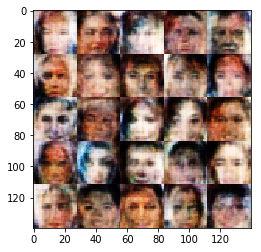

Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.4280
Epoch 1/1... Discriminator Loss: 1.6927... Generator Loss: 0.2328
Epoch 1/1... Discriminator Loss: 1.3761... Generator Loss: 0.4455
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.5814
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.4605
Epoch 1/1... Discriminator Loss: 1.2423... Generator Loss: 0.5663
Epoch 1/1... Discriminator Loss: 1.4300... Generator Loss: 0.3694
Epoch 1/1... Discriminator Loss: 1.0751... Generator Loss: 0.9074
Epoch 1/1... Discriminator Loss: 1.4961... Generator Loss: 0.3284


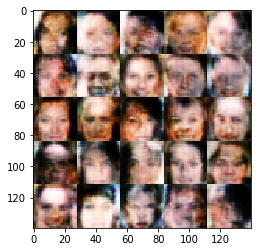

Epoch 1/1... Discriminator Loss: 8.5958... Generator Loss: 0.1724
Epoch 1/1... Discriminator Loss: 2.0821... Generator Loss: 0.1308
Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.4836
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.3659
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.4633
Epoch 1/1... Discriminator Loss: 1.3642... Generator Loss: 0.4236
Epoch 1/1... Discriminator Loss: 1.3889... Generator Loss: 0.4181
Epoch 1/1... Discriminator Loss: 1.2805... Generator Loss: 0.5118
Epoch 1/1... Discriminator Loss: 1.3336... Generator Loss: 0.4662
Epoch 1/1... Discriminator Loss: 1.1856... Generator Loss: 0.9425


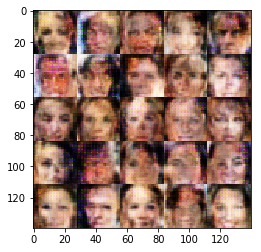

Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 0.5873
Epoch 1/1... Discriminator Loss: 2.8690... Generator Loss: 0.0632
Epoch 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.5492
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.3932
Epoch 1/1... Discriminator Loss: 1.2941... Generator Loss: 0.4924
Epoch 1/1... Discriminator Loss: 1.7741... Generator Loss: 0.1810
Epoch 1/1... Discriminator Loss: 1.2220... Generator Loss: 0.6776
Epoch 1/1... Discriminator Loss: 1.3032... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.2130... Generator Loss: 0.9960
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.7572


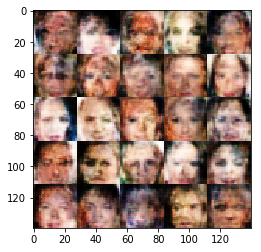

Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.1544... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.1405... Generator Loss: 1.0071
Epoch 1/1... Discriminator Loss: 1.1288... Generator Loss: 1.0668
Epoch 1/1... Discriminator Loss: 1.0783... Generator Loss: 1.0333
Epoch 1/1... Discriminator Loss: 1.7675... Generator Loss: 0.8185
Epoch 1/1... Discriminator Loss: 2.0145... Generator Loss: 0.9446
Epoch 1/1... Discriminator Loss: 1.3526... Generator Loss: 0.6277
Epoch 1/1... Discriminator Loss: 1.4293... Generator Loss: 0.3570
Epoch 1/1... Discriminator Loss: 1.3967... Generator Loss: 0.4145


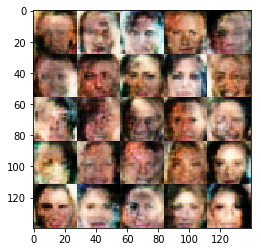

Epoch 1/1... Discriminator Loss: 1.3632... Generator Loss: 0.5056
Epoch 1/1... Discriminator Loss: 1.3985... Generator Loss: 0.4190
Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.6861... Generator Loss: 0.8770
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.7761
Epoch 1/1... Discriminator Loss: 1.2984... Generator Loss: 0.4899
Epoch 1/1... Discriminator Loss: 1.9157... Generator Loss: 0.1561
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.2496... Generator Loss: 0.6026
Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.5097


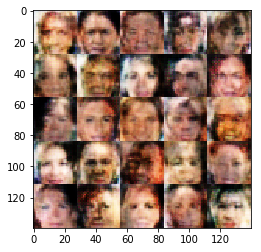

Epoch 1/1... Discriminator Loss: 1.2546... Generator Loss: 0.5348
Epoch 1/1... Discriminator Loss: 1.6116... Generator Loss: 0.2475
Epoch 1/1... Discriminator Loss: 1.3583... Generator Loss: 0.4422
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.3639
Epoch 1/1... Discriminator Loss: 1.2102... Generator Loss: 0.5605
Epoch 1/1... Discriminator Loss: 1.1779... Generator Loss: 0.9086
Epoch 1/1... Discriminator Loss: 1.3124... Generator Loss: 0.4852
Epoch 1/1... Discriminator Loss: 2.1653... Generator Loss: 0.2319
Epoch 1/1... Discriminator Loss: 1.2293... Generator Loss: 0.6281
Epoch 1/1... Discriminator Loss: 1.3412... Generator Loss: 0.4616


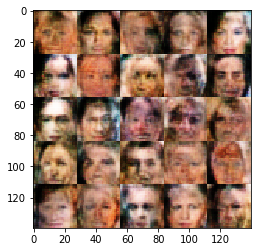

Epoch 1/1... Discriminator Loss: 1.6252... Generator Loss: 0.2382
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.4620
Epoch 1/1... Discriminator Loss: 1.2744... Generator Loss: 0.4860
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.6137
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.4769
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.3360
Epoch 1/1... Discriminator Loss: 1.2770... Generator Loss: 0.5741
Epoch 1/1... Discriminator Loss: 1.3178... Generator Loss: 0.4518
Epoch 1/1... Discriminator Loss: 1.2612... Generator Loss: 0.5075
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.3403


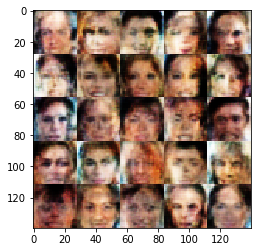

Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.4054
Epoch 1/1... Discriminator Loss: 1.2060... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.7788
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 1.2472
Epoch 1/1... Discriminator Loss: 1.3026... Generator Loss: 0.6206
Epoch 1/1... Discriminator Loss: 1.2696... Generator Loss: 0.9198
Epoch 1/1... Discriminator Loss: 1.1709... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.1846... Generator Loss: 1.4266
Epoch 1/1... Discriminator Loss: 2.2906... Generator Loss: 1.4275
Epoch 1/1... Discriminator Loss: 3.6723... Generator Loss: 0.4987


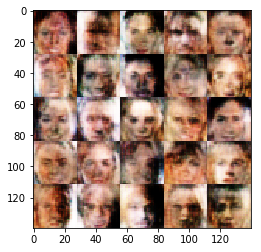

Epoch 1/1... Discriminator Loss: 1.8263... Generator Loss: 0.5315
Epoch 1/1... Discriminator Loss: 1.4309... Generator Loss: 0.3705
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.4182
Epoch 1/1... Discriminator Loss: 1.3442... Generator Loss: 0.4568
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.6126
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.5550
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.4185
Epoch 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.5997
Epoch 1/1... Discriminator Loss: 1.3330... Generator Loss: 0.6070
Epoch 1/1... Discriminator Loss: 1.2095... Generator Loss: 0.9594


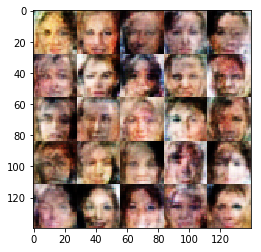

Epoch 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.5906
Epoch 1/1... Discriminator Loss: 1.8993... Generator Loss: 0.2012
Epoch 1/1... Discriminator Loss: 1.4443... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.5304
Epoch 1/1... Discriminator Loss: 1.3177... Generator Loss: 0.5166
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.3796
Epoch 1/1... Discriminator Loss: 1.3022... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.5380
Epoch 1/1... Discriminator Loss: 1.3152... Generator Loss: 0.4930
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.4616


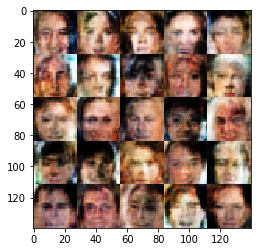

Epoch 1/1... Discriminator Loss: 1.2063... Generator Loss: 0.6228
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.8313
Epoch 1/1... Discriminator Loss: 1.4418... Generator Loss: 0.9287
Epoch 1/1... Discriminator Loss: 1.2098... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.9355
Epoch 1/1... Discriminator Loss: 1.2221... Generator Loss: 0.8075
Epoch 1/1... Discriminator Loss: 1.3444... Generator Loss: 1.0743
Epoch 1/1... Discriminator Loss: 1.6387... Generator Loss: 0.2242
Epoch 1/1... Discriminator Loss: 1.2675... Generator Loss: 0.5413
Epoch 1/1... Discriminator Loss: 1.1799... Generator Loss: 1.4557


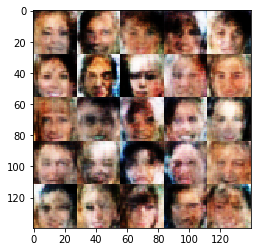

Epoch 1/1... Discriminator Loss: 1.3867... Generator Loss: 0.3811
Epoch 1/1... Discriminator Loss: 1.5454... Generator Loss: 0.8470
Epoch 1/1... Discriminator Loss: 6.4373... Generator Loss: 0.0064
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.4073
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.3628
Epoch 1/1... Discriminator Loss: 1.2965... Generator Loss: 0.5189
Epoch 1/1... Discriminator Loss: 1.2386... Generator Loss: 0.5807
Epoch 1/1... Discriminator Loss: 1.4482... Generator Loss: 0.3216
Epoch 1/1... Discriminator Loss: 1.5331... Generator Loss: 0.2942
Epoch 1/1... Discriminator Loss: 1.3808... Generator Loss: 0.4488


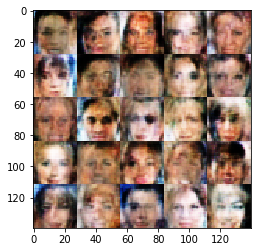

Epoch 1/1... Discriminator Loss: 1.2017... Generator Loss: 0.9869
Epoch 1/1... Discriminator Loss: 1.2874... Generator Loss: 0.4800
Epoch 1/1... Discriminator Loss: 1.7581... Generator Loss: 0.1976
Epoch 1/1... Discriminator Loss: 1.4149... Generator Loss: 0.4187
Epoch 1/1... Discriminator Loss: 1.2348... Generator Loss: 0.9812
Epoch 1/1... Discriminator Loss: 1.2426... Generator Loss: 1.1895
Epoch 1/1... Discriminator Loss: 1.3379... Generator Loss: 0.4154
Epoch 1/1... Discriminator Loss: 1.7489... Generator Loss: 1.1801
Epoch 1/1... Discriminator Loss: 1.2644... Generator Loss: 0.5310
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.5571


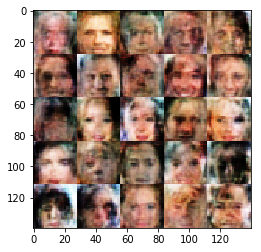

Epoch 1/1... Discriminator Loss: 1.4681... Generator Loss: 0.3203
Epoch 1/1... Discriminator Loss: 1.2637... Generator Loss: 0.5084
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.5418
Epoch 1/1... Discriminator Loss: 1.3508... Generator Loss: 0.9998
Epoch 1/1... Discriminator Loss: 1.2469... Generator Loss: 0.8842
Epoch 1/1... Discriminator Loss: 1.5554... Generator Loss: 0.9719
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.4617
Epoch 1/1... Discriminator Loss: 1.2540... Generator Loss: 0.5443
Epoch 1/1... Discriminator Loss: 1.5379... Generator Loss: 0.2883
Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 1.0044


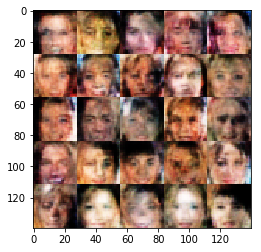

Epoch 1/1... Discriminator Loss: 1.3082... Generator Loss: 0.8467
Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 1.0347
Epoch 1/1... Discriminator Loss: 1.5183... Generator Loss: 0.9868
Epoch 1/1... Discriminator Loss: 1.2942... Generator Loss: 0.6189
Epoch 1/1... Discriminator Loss: 1.2150... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.5621... Generator Loss: 1.0584
Epoch 1/1... Discriminator Loss: 1.4923... Generator Loss: 0.9016
Epoch 1/1... Discriminator Loss: 1.2641... Generator Loss: 0.5762
Epoch 1/1... Discriminator Loss: 1.3419... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.6322


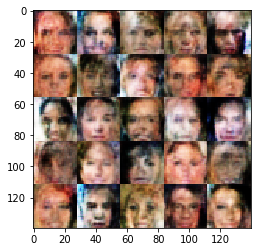

Epoch 1/1... Discriminator Loss: 1.3339... Generator Loss: 0.4454
Epoch 1/1... Discriminator Loss: 1.8400... Generator Loss: 0.1931
Epoch 1/1... Discriminator Loss: 1.3092... Generator Loss: 0.4829
Epoch 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.6231
Epoch 1/1... Discriminator Loss: 1.5439... Generator Loss: 0.2677
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.3594
Epoch 1/1... Discriminator Loss: 1.3943... Generator Loss: 0.3734
Epoch 1/1... Discriminator Loss: 1.2385... Generator Loss: 0.5086
Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.4978
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.6640


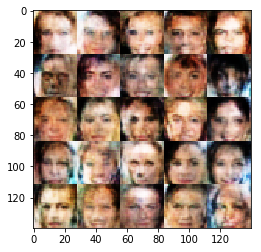

Epoch 1/1... Discriminator Loss: 1.1853... Generator Loss: 0.6999
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.4450
Epoch 1/1... Discriminator Loss: 1.0953... Generator Loss: 1.1619
Epoch 1/1... Discriminator Loss: 1.1859... Generator Loss: 1.1168
Epoch 1/1... Discriminator Loss: 1.1451... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.2487... Generator Loss: 1.2455
Epoch 1/1... Discriminator Loss: 4.5406... Generator Loss: 1.1714
Epoch 1/1... Discriminator Loss: 2.7250... Generator Loss: 0.5745
Epoch 1/1... Discriminator Loss: 1.5271... Generator Loss: 0.3401
Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.6196


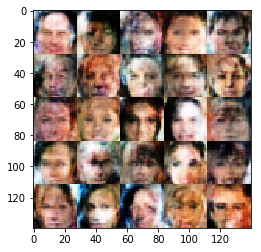

Epoch 1/1... Discriminator Loss: 1.3293... Generator Loss: 0.5472
Epoch 1/1... Discriminator Loss: 1.3474... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 0.8665
Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 0.6768
Epoch 1/1... Discriminator Loss: 1.2179... Generator Loss: 0.9858
Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.6558
Epoch 1/1... Discriminator Loss: 1.1770... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 1.8696... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.4944... Generator Loss: 0.3738


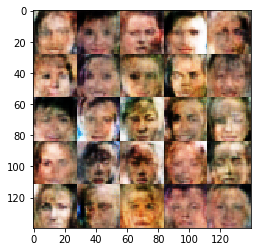

Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.5341
Epoch 1/1... Discriminator Loss: 1.3104... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 1.3174... Generator Loss: 0.5068
Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 0.4319
Epoch 1/1... Discriminator Loss: 1.2944... Generator Loss: 0.6041
Epoch 1/1... Discriminator Loss: 1.5368... Generator Loss: 0.2779
Epoch 1/1... Discriminator Loss: 1.3451... Generator Loss: 0.4620
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.4124... Generator Loss: 0.3563
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.4511


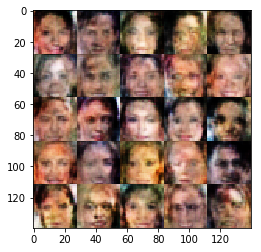

Epoch 1/1... Discriminator Loss: 1.4620... Generator Loss: 0.3307
Epoch 1/1... Discriminator Loss: 1.5413... Generator Loss: 0.2801
Epoch 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.5149
Epoch 1/1... Discriminator Loss: 1.2101... Generator Loss: 0.6759
Epoch 1/1... Discriminator Loss: 1.3141... Generator Loss: 0.5015
Epoch 1/1... Discriminator Loss: 1.3313... Generator Loss: 0.4946
Epoch 1/1... Discriminator Loss: 1.2812... Generator Loss: 0.7466
Epoch 1/1... Discriminator Loss: 1.2937... Generator Loss: 0.5172
Epoch 1/1... Discriminator Loss: 1.3557... Generator Loss: 0.4391
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 0.8565


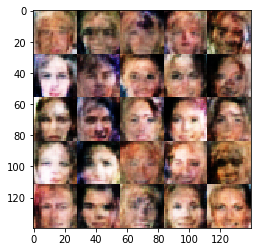

Epoch 1/1... Discriminator Loss: 1.4495... Generator Loss: 0.8255
Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.5699
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.3727
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.6535
Epoch 1/1... Discriminator Loss: 1.6200... Generator Loss: 1.1993
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.4974
Epoch 1/1... Discriminator Loss: 1.3984... Generator Loss: 0.3807
Epoch 1/1... Discriminator Loss: 1.2366... Generator Loss: 0.5520
Epoch 1/1... Discriminator Loss: 1.3557... Generator Loss: 0.4011
Epoch 1/1... Discriminator Loss: 1.3850... Generator Loss: 0.4057


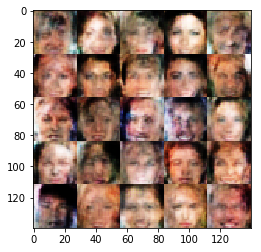

Epoch 1/1... Discriminator Loss: 1.3313... Generator Loss: 0.9085
Epoch 1/1... Discriminator Loss: 1.2461... Generator Loss: 0.5234
Epoch 1/1... Discriminator Loss: 1.2412... Generator Loss: 0.8588
Epoch 1/1... Discriminator Loss: 1.3203... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 1.2361... Generator Loss: 0.5844
Epoch 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.4063
Epoch 1/1... Discriminator Loss: 1.4283... Generator Loss: 0.3610
Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.4600
Epoch 1/1... Discriminator Loss: 3.3878... Generator Loss: 0.0580
Epoch 1/1... Discriminator Loss: 2.1857... Generator Loss: 0.4321


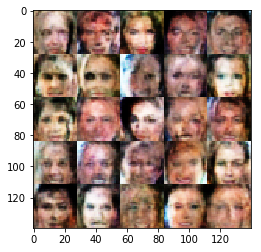

Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.4422
Epoch 1/1... Discriminator Loss: 1.3206... Generator Loss: 0.5565
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.7578
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.5283
Epoch 1/1... Discriminator Loss: 1.2940... Generator Loss: 0.5722
Epoch 1/1... Discriminator Loss: 1.4278... Generator Loss: 0.3452
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.5121
Epoch 1/1... Discriminator Loss: 1.3521... Generator Loss: 0.4260
Epoch 1/1... Discriminator Loss: 1.3881... Generator Loss: 0.4050


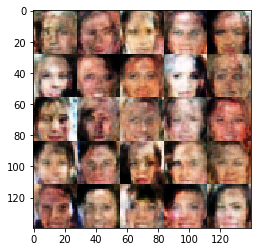

Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.7282
Epoch 1/1... Discriminator Loss: 1.3236... Generator Loss: 0.7274
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.4032
Epoch 1/1... Discriminator Loss: 1.2429... Generator Loss: 0.7866
Epoch 1/1... Discriminator Loss: 1.1705... Generator Loss: 0.8321
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.9673... Generator Loss: 0.1596
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 0.3969
Epoch 1/1... Discriminator Loss: 1.3601... Generator Loss: 0.4368
Epoch 1/1... Discriminator Loss: 1.2451... Generator Loss: 0.5815


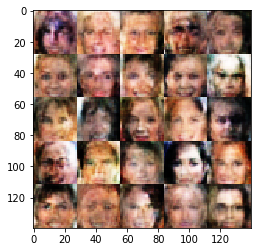

Epoch 1/1... Discriminator Loss: 1.2822... Generator Loss: 0.5895
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.5241
Epoch 1/1... Discriminator Loss: 1.4834... Generator Loss: 0.3120
Epoch 1/1... Discriminator Loss: 1.2009... Generator Loss: 0.6956
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.2297... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 1.1947... Generator Loss: 0.9446
Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.3079... Generator Loss: 0.6963
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.7743


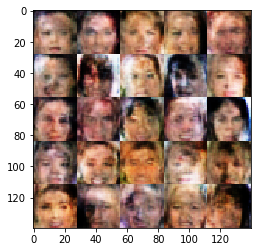

Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.6491
Epoch 1/1... Discriminator Loss: 1.4926... Generator Loss: 1.1654
Epoch 1/1... Discriminator Loss: 1.2956... Generator Loss: 0.4766
Epoch 1/1... Discriminator Loss: 2.5581... Generator Loss: 0.1468
Epoch 1/1... Discriminator Loss: 1.8035... Generator Loss: 0.3377
Epoch 1/1... Discriminator Loss: 1.5159... Generator Loss: 0.3533
Epoch 1/1... Discriminator Loss: 1.4915... Generator Loss: 0.7618
Epoch 1/1... Discriminator Loss: 1.4056... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.3830
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.6702


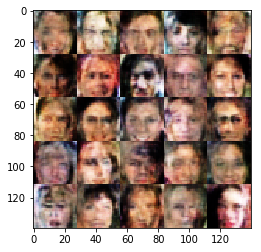

Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.8187
Epoch 1/1... Discriminator Loss: 1.2764... Generator Loss: 0.5734
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 0.4070
Epoch 1/1... Discriminator Loss: 1.6272... Generator Loss: 0.2349
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.3730
Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.9385
Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.7934
Epoch 1/1... Discriminator Loss: 1.2561... Generator Loss: 0.8749
Epoch 1/1... Discriminator Loss: 1.1908... Generator Loss: 0.6912


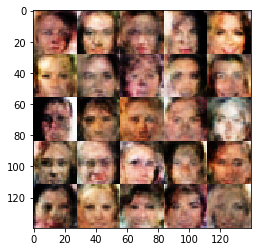

Epoch 1/1... Discriminator Loss: 1.5585... Generator Loss: 0.9696
Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.2319... Generator Loss: 0.7734
Epoch 1/1... Discriminator Loss: 1.2242... Generator Loss: 0.6965
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.7197
Epoch 1/1... Discriminator Loss: 1.3984... Generator Loss: 0.8778
Epoch 1/1... Discriminator Loss: 1.6061... Generator Loss: 0.2596
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.7378
Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 1.0434


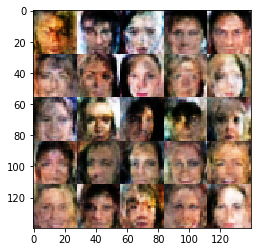

Epoch 1/1... Discriminator Loss: 2.0587... Generator Loss: 0.5452
Epoch 1/1... Discriminator Loss: 1.4833... Generator Loss: 0.3164
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.5290
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.7798
Epoch 1/1... Discriminator Loss: 1.2794... Generator Loss: 0.8605
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.6130
Epoch 1/1... Discriminator Loss: 1.3664... Generator Loss: 0.4349
Epoch 1/1... Discriminator Loss: 1.4457... Generator Loss: 0.3649
Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.7684


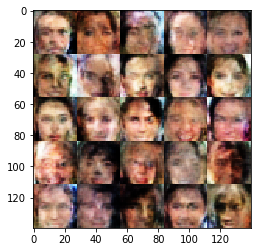

Epoch 1/1... Discriminator Loss: 1.2594... Generator Loss: 0.5947
Epoch 1/1... Discriminator Loss: 1.3077... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.2317... Generator Loss: 0.7563
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.9157
Epoch 1/1... Discriminator Loss: 1.2364... Generator Loss: 0.7268
Epoch 1/1... Discriminator Loss: 1.2094... Generator Loss: 0.5832
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.4054
Epoch 1/1... Discriminator Loss: 1.3008... Generator Loss: 0.5931
Epoch 1/1... Discriminator Loss: 1.7561... Generator Loss: 1.0911
Epoch 1/1... Discriminator Loss: 1.4316... Generator Loss: 0.7848


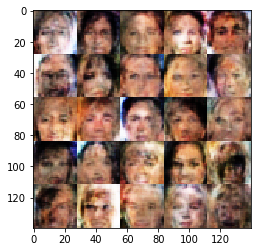

Epoch 1/1... Discriminator Loss: 1.3509... Generator Loss: 0.8698
Epoch 1/1... Discriminator Loss: 1.8507... Generator Loss: 0.1760
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.5295
Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.5509
Epoch 1/1... Discriminator Loss: 1.5923... Generator Loss: 0.2480
Epoch 1/1... Discriminator Loss: 1.2343... Generator Loss: 0.6097
Epoch 1/1... Discriminator Loss: 1.5704... Generator Loss: 0.3400
Epoch 1/1... Discriminator Loss: 1.2480... Generator Loss: 0.5459
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.8849
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.4018


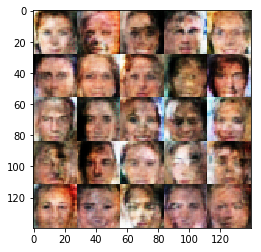

Epoch 1/1... Discriminator Loss: 1.2087... Generator Loss: 0.6181
Epoch 1/1... Discriminator Loss: 1.5260... Generator Loss: 0.2749
Epoch 1/1... Discriminator Loss: 1.4504... Generator Loss: 0.3415
Epoch 1/1... Discriminator Loss: 1.2123... Generator Loss: 0.6081
Epoch 1/1... Discriminator Loss: 1.6208... Generator Loss: 0.2312
Epoch 1/1... Discriminator Loss: 1.6955... Generator Loss: 0.2207
Epoch 1/1... Discriminator Loss: 1.4207... Generator Loss: 0.3441
Epoch 1/1... Discriminator Loss: 1.5095... Generator Loss: 0.3243
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 0.6408
Epoch 1/1... Discriminator Loss: 1.2159... Generator Loss: 1.2660


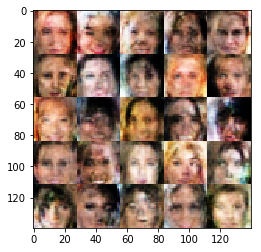

Epoch 1/1... Discriminator Loss: 1.1711... Generator Loss: 0.7632
Epoch 1/1... Discriminator Loss: 1.5033... Generator Loss: 1.0151
Epoch 1/1... Discriminator Loss: 1.2802... Generator Loss: 0.5154
Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 0.9759
Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.4479
Epoch 1/1... Discriminator Loss: 1.3007... Generator Loss: 0.4401
Epoch 1/1... Discriminator Loss: 1.2172... Generator Loss: 0.5350
Epoch 1/1... Discriminator Loss: 1.2218... Generator Loss: 0.5712
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.4505
Epoch 1/1... Discriminator Loss: 1.1583... Generator Loss: 0.8902


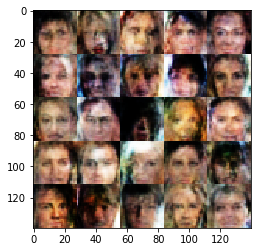

Epoch 1/1... Discriminator Loss: 1.3532... Generator Loss: 1.1878
Epoch 1/1... Discriminator Loss: 1.1616... Generator Loss: 0.6726
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.3792
Epoch 1/1... Discriminator Loss: 1.1193... Generator Loss: 0.9628
Epoch 1/1... Discriminator Loss: 1.7080... Generator Loss: 1.1562
Epoch 1/1... Discriminator Loss: 1.6164... Generator Loss: 0.3311
Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 0.3955
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.3436... Generator Loss: 0.6165
Epoch 1/1... Discriminator Loss: 1.2686... Generator Loss: 0.6912


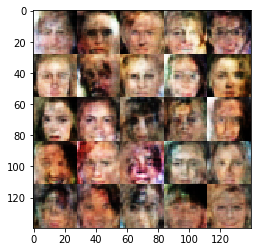

Epoch 1/1... Discriminator Loss: 1.2213... Generator Loss: 0.8535
Epoch 1/1... Discriminator Loss: 1.2701... Generator Loss: 0.9707
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 1.0337
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.3987
Epoch 1/1... Discriminator Loss: 1.2804... Generator Loss: 0.4551
Epoch 1/1... Discriminator Loss: 1.5806... Generator Loss: 0.2733
Epoch 1/1... Discriminator Loss: 1.6646... Generator Loss: 0.2268
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.3289
Epoch 1/1... Discriminator Loss: 1.3226... Generator Loss: 0.4182
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 1.0329


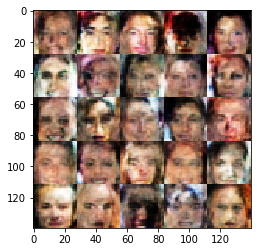

Epoch 1/1... Discriminator Loss: 1.5749... Generator Loss: 0.2743
Epoch 1/1... Discriminator Loss: 1.3797... Generator Loss: 0.3942
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.3068
Epoch 1/1... Discriminator Loss: 1.2178... Generator Loss: 0.9058
Epoch 1/1... Discriminator Loss: 1.2872... Generator Loss: 1.1461
Epoch 1/1... Discriminator Loss: 1.5988... Generator Loss: 1.3402
Epoch 1/1... Discriminator Loss: 1.1521... Generator Loss: 1.0736
Epoch 1/1... Discriminator Loss: 1.2999... Generator Loss: 1.2142
Epoch 1/1... Discriminator Loss: 1.3453... Generator Loss: 1.1709
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.3752


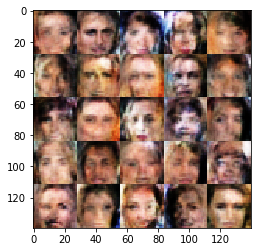

Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.6528
Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 1.6266... Generator Loss: 0.2367
Epoch 1/1... Discriminator Loss: 1.4270... Generator Loss: 0.3402
Epoch 1/1... Discriminator Loss: 1.4609... Generator Loss: 0.3230
Epoch 1/1... Discriminator Loss: 1.1317... Generator Loss: 0.8022
Epoch 1/1... Discriminator Loss: 1.2201... Generator Loss: 1.2226
Epoch 1/1... Discriminator Loss: 1.5350... Generator Loss: 1.3826
Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.1965... Generator Loss: 0.6633


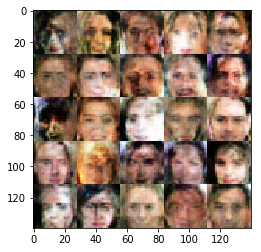

Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 1.0983... Generator Loss: 0.9929
Epoch 1/1... Discriminator Loss: 1.1408... Generator Loss: 0.8723
Epoch 1/1... Discriminator Loss: 1.7034... Generator Loss: 0.2112
Epoch 1/1... Discriminator Loss: 1.2747... Generator Loss: 0.5631
Epoch 1/1... Discriminator Loss: 1.1822... Generator Loss: 1.2203
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.9025
Epoch 1/1... Discriminator Loss: 1.1426... Generator Loss: 1.1509
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 1.3157
Epoch 1/1... Discriminator Loss: 1.7799... Generator Loss: 1.1304


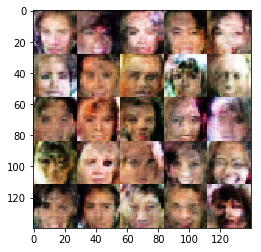

Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.3782
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.3603
Epoch 1/1... Discriminator Loss: 1.1795... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.4242... Generator Loss: 0.3395
Epoch 1/1... Discriminator Loss: 1.0728... Generator Loss: 1.0038
Epoch 1/1... Discriminator Loss: 1.5392... Generator Loss: 1.0888
Epoch 1/1... Discriminator Loss: 1.1794... Generator Loss: 0.6168
Epoch 1/1... Discriminator Loss: 1.1130... Generator Loss: 0.9084
Epoch 1/1... Discriminator Loss: 1.4697... Generator Loss: 0.3240
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.3972


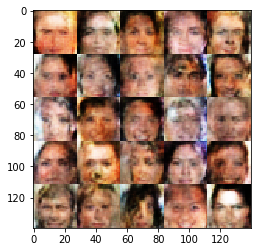

Epoch 1/1... Discriminator Loss: 1.1052... Generator Loss: 1.0478
Epoch 1/1... Discriminator Loss: 1.2747... Generator Loss: 1.1881
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.6957
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.9419
Epoch 1/1... Discriminator Loss: 1.2248... Generator Loss: 1.2474
Epoch 1/1... Discriminator Loss: 1.0649... Generator Loss: 1.0175
Epoch 1/1... Discriminator Loss: 1.2201... Generator Loss: 1.2414
Epoch 1/1... Discriminator Loss: 1.2526... Generator Loss: 1.3803
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.9833
Epoch 1/1... Discriminator Loss: 1.1760... Generator Loss: 0.9662


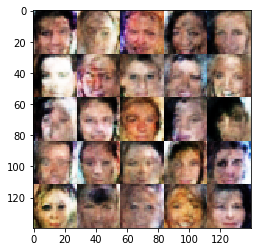

Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 1.3040
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.5745
Epoch 1/1... Discriminator Loss: 1.0742... Generator Loss: 0.8456
Epoch 1/1... Discriminator Loss: 1.5062... Generator Loss: 0.3121
Epoch 1/1... Discriminator Loss: 1.2229... Generator Loss: 0.6058
Epoch 1/1... Discriminator Loss: 1.4663... Generator Loss: 0.3202
Epoch 1/1... Discriminator Loss: 1.9640... Generator Loss: 0.1588
Epoch 1/1... Discriminator Loss: 1.1471... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.4272
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.5089


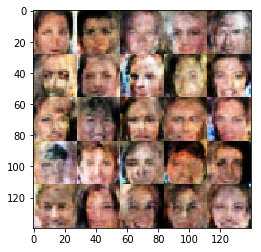

Epoch 1/1... Discriminator Loss: 1.3212... Generator Loss: 0.4342
Epoch 1/1... Discriminator Loss: 1.5612... Generator Loss: 0.2833
Epoch 1/1... Discriminator Loss: 1.2268... Generator Loss: 0.5417
Epoch 1/1... Discriminator Loss: 1.6759... Generator Loss: 0.2445
Epoch 1/1... Discriminator Loss: 1.0543... Generator Loss: 1.2100
Epoch 1/1... Discriminator Loss: 1.1610... Generator Loss: 1.2825
Epoch 1/1... Discriminator Loss: 1.7256... Generator Loss: 0.2359
Epoch 1/1... Discriminator Loss: 1.1006... Generator Loss: 0.8206
Epoch 1/1... Discriminator Loss: 1.2186... Generator Loss: 0.5498
Epoch 1/1... Discriminator Loss: 1.5263... Generator Loss: 0.2871


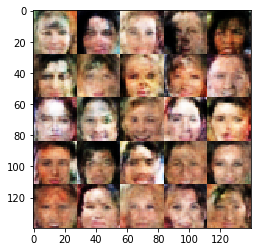

Epoch 1/1... Discriminator Loss: 1.5452... Generator Loss: 0.2879
Epoch 1/1... Discriminator Loss: 1.1267... Generator Loss: 1.0380
Epoch 1/1... Discriminator Loss: 1.0694... Generator Loss: 0.8804
Epoch 1/1... Discriminator Loss: 1.0503... Generator Loss: 0.9562
Epoch 1/1... Discriminator Loss: 1.1622... Generator Loss: 1.2893
Epoch 1/1... Discriminator Loss: 1.1417... Generator Loss: 1.0643
Epoch 1/1... Discriminator Loss: 1.2201... Generator Loss: 1.2037
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 1.3525
Epoch 1/1... Discriminator Loss: 1.2566... Generator Loss: 1.2190
Epoch 1/1... Discriminator Loss: 1.3537... Generator Loss: 1.2190


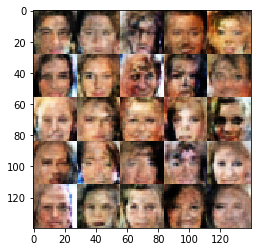

Epoch 1/1... Discriminator Loss: 1.1035... Generator Loss: 1.4130
Epoch 1/1... Discriminator Loss: 1.1110... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.4135
Epoch 1/1... Discriminator Loss: 1.0603... Generator Loss: 0.9820
Epoch 1/1... Discriminator Loss: 1.5422... Generator Loss: 0.3212
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.3963
Epoch 1/1... Discriminator Loss: 1.0693... Generator Loss: 0.8377
Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 1.7108
Epoch 1/1... Discriminator Loss: 1.1130... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.4133... Generator Loss: 0.3801


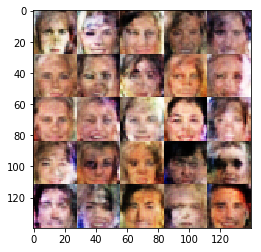

Epoch 1/1... Discriminator Loss: 1.2960... Generator Loss: 0.4464
Epoch 1/1... Discriminator Loss: 1.1676... Generator Loss: 1.6154
Epoch 1/1... Discriminator Loss: 1.1422... Generator Loss: 0.6342
Epoch 1/1... Discriminator Loss: 1.5101... Generator Loss: 0.3312
Epoch 1/1... Discriminator Loss: 1.0809... Generator Loss: 0.7845
Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 0.3516
Epoch 1/1... Discriminator Loss: 1.3619... Generator Loss: 0.3900
Epoch 1/1... Discriminator Loss: 1.1206... Generator Loss: 1.1201
Epoch 1/1... Discriminator Loss: 1.1368... Generator Loss: 1.0706
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 1.4478


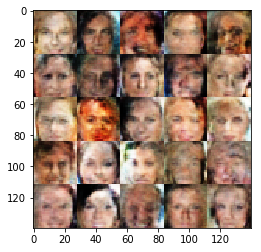

Epoch 1/1... Discriminator Loss: 1.8269... Generator Loss: 1.3639
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.3739
Epoch 1/1... Discriminator Loss: 1.3308... Generator Loss: 0.4193
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.3903
Epoch 1/1... Discriminator Loss: 1.1468... Generator Loss: 1.1710
Epoch 1/1... Discriminator Loss: 1.2852... Generator Loss: 0.4529
Epoch 1/1... Discriminator Loss: 1.0681... Generator Loss: 0.8976
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 0.9872
Epoch 1/1... Discriminator Loss: 1.5691... Generator Loss: 0.3095
Epoch 1/1... Discriminator Loss: 1.2139... Generator Loss: 0.6223


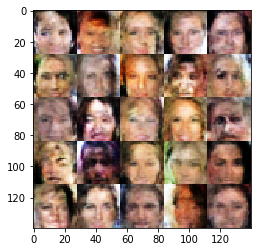

Epoch 1/1... Discriminator Loss: 1.0580... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.0648... Generator Loss: 0.8773
Epoch 1/1... Discriminator Loss: 2.2596... Generator Loss: 0.1053
Epoch 1/1... Discriminator Loss: 1.3029... Generator Loss: 0.4347
Epoch 1/1... Discriminator Loss: 1.1108... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.2507... Generator Loss: 1.6048
Epoch 1/1... Discriminator Loss: 1.1206... Generator Loss: 0.8999
Epoch 1/1... Discriminator Loss: 1.0509... Generator Loss: 1.0770
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 1.0752
Epoch 1/1... Discriminator Loss: 1.1114... Generator Loss: 0.7830


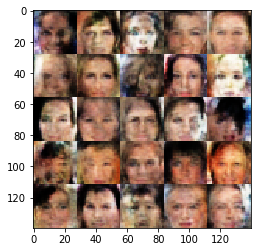

Epoch 1/1... Discriminator Loss: 1.1902... Generator Loss: 1.3442
Epoch 1/1... Discriminator Loss: 1.0252... Generator Loss: 1.2289
Epoch 1/1... Discriminator Loss: 1.1048... Generator Loss: 1.3681
Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 1.6646
Epoch 1/1... Discriminator Loss: 1.4108... Generator Loss: 1.1017
Epoch 1/1... Discriminator Loss: 1.0749... Generator Loss: 0.8587
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.3479
Epoch 1/1... Discriminator Loss: 1.0474... Generator Loss: 0.9128
Epoch 1/1... Discriminator Loss: 1.4909... Generator Loss: 0.3054
Epoch 1/1... Discriminator Loss: 1.1743... Generator Loss: 0.5998


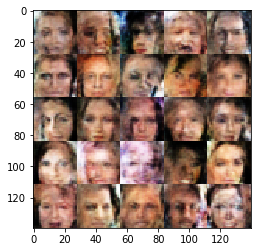

Epoch 1/1... Discriminator Loss: 1.9325... Generator Loss: 0.1862
Epoch 1/1... Discriminator Loss: 1.1303... Generator Loss: 1.2677
Epoch 1/1... Discriminator Loss: 1.1022... Generator Loss: 0.9209
Epoch 1/1... Discriminator Loss: 1.2104... Generator Loss: 1.2817
Epoch 1/1... Discriminator Loss: 1.0926... Generator Loss: 0.8168
Epoch 1/1... Discriminator Loss: 1.0910... Generator Loss: 1.5643
Epoch 1/1... Discriminator Loss: 1.4646... Generator Loss: 1.3360
Epoch 1/1... Discriminator Loss: 1.3390... Generator Loss: 1.0368
Epoch 1/1... Discriminator Loss: 1.0480... Generator Loss: 1.0159
Epoch 1/1... Discriminator Loss: 1.0663... Generator Loss: 0.9634


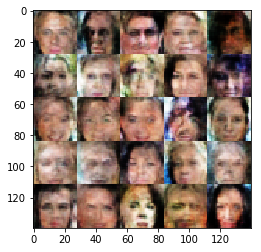

Epoch 1/1... Discriminator Loss: 1.1259... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 1.1309... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 1.1549... Generator Loss: 0.6135
Epoch 1/1... Discriminator Loss: 1.5410... Generator Loss: 0.2878
Epoch 1/1... Discriminator Loss: 1.1200... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.0842... Generator Loss: 0.8288
Epoch 1/1... Discriminator Loss: 1.0636... Generator Loss: 0.8038
Epoch 1/1... Discriminator Loss: 1.0519... Generator Loss: 1.4478
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 1.2013
Epoch 1/1... Discriminator Loss: 1.4655... Generator Loss: 1.5440


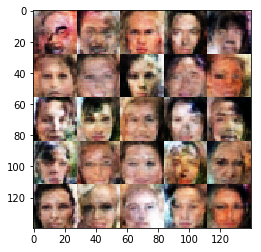

Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 0.9441
Epoch 1/1... Discriminator Loss: 1.5201... Generator Loss: 1.2777
Epoch 1/1... Discriminator Loss: 1.1883... Generator Loss: 0.7068
Epoch 1/1... Discriminator Loss: 1.3321... Generator Loss: 1.3906
Epoch 1/1... Discriminator Loss: 1.1268... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 1.6444
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.6718... Generator Loss: 0.2329
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 1.0105
Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 0.4439


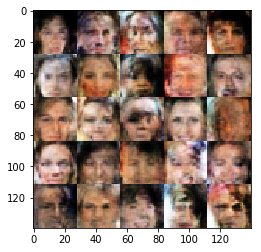

Epoch 1/1... Discriminator Loss: 1.0067... Generator Loss: 1.2259
Epoch 1/1... Discriminator Loss: 1.1574... Generator Loss: 1.3459
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 1.5404
Epoch 1/1... Discriminator Loss: 1.1323... Generator Loss: 1.4189
Epoch 1/1... Discriminator Loss: 1.5385... Generator Loss: 0.2790
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 1.0779... Generator Loss: 0.7834
Epoch 1/1... Discriminator Loss: 1.0296... Generator Loss: 0.9389
Epoch 1/1... Discriminator Loss: 1.6644... Generator Loss: 0.2320
Epoch 1/1... Discriminator Loss: 1.0803... Generator Loss: 0.8181


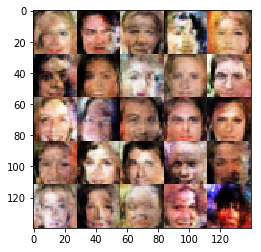

Epoch 1/1... Discriminator Loss: 1.2495... Generator Loss: 1.5496
Epoch 1/1... Discriminator Loss: 1.0680... Generator Loss: 0.8313
Epoch 1/1... Discriminator Loss: 1.5513... Generator Loss: 0.2654
Epoch 1/1... Discriminator Loss: 1.1415... Generator Loss: 0.6589
Epoch 1/1... Discriminator Loss: 1.0540... Generator Loss: 1.3028
Epoch 1/1... Discriminator Loss: 1.0641... Generator Loss: 1.1795
Epoch 1/1... Discriminator Loss: 1.0812... Generator Loss: 0.8021
Epoch 1/1... Discriminator Loss: 1.8182... Generator Loss: 0.1908
Epoch 1/1... Discriminator Loss: 1.0514... Generator Loss: 1.1569
Epoch 1/1... Discriminator Loss: 1.0934... Generator Loss: 1.4602


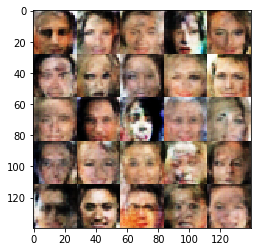

Epoch 1/1... Discriminator Loss: 1.9752... Generator Loss: 0.1594
Epoch 1/1... Discriminator Loss: 1.1419... Generator Loss: 0.7972
Epoch 1/1... Discriminator Loss: 1.5586... Generator Loss: 0.2896
Epoch 1/1... Discriminator Loss: 1.3925... Generator Loss: 0.3708
Epoch 1/1... Discriminator Loss: 1.2118... Generator Loss: 0.5638
Epoch 1/1... Discriminator Loss: 1.6169... Generator Loss: 0.2556
Epoch 1/1... Discriminator Loss: 1.0774... Generator Loss: 0.7979
Epoch 1/1... Discriminator Loss: 1.5169... Generator Loss: 0.2903
Epoch 1/1... Discriminator Loss: 1.0852... Generator Loss: 1.1432
Epoch 1/1... Discriminator Loss: 1.0296... Generator Loss: 0.9712


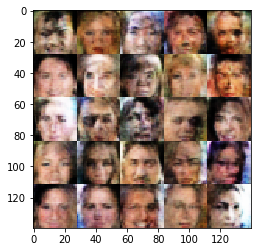

Epoch 1/1... Discriminator Loss: 1.0585... Generator Loss: 1.4024
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 1.7934
Epoch 1/1... Discriminator Loss: 1.2083... Generator Loss: 0.5334
Epoch 1/1... Discriminator Loss: 1.0912... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 1.5416... Generator Loss: 0.2826
Epoch 1/1... Discriminator Loss: 1.1014... Generator Loss: 1.3092
Epoch 1/1... Discriminator Loss: 1.2601... Generator Loss: 0.4663
Epoch 1/1... Discriminator Loss: 1.0847... Generator Loss: 1.4549
Epoch 1/1... Discriminator Loss: 1.6472... Generator Loss: 1.3295
Epoch 1/1... Discriminator Loss: 1.1319... Generator Loss: 0.7155


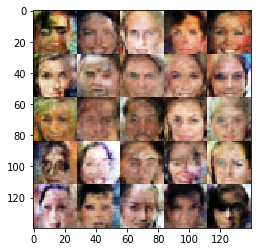

Epoch 1/1... Discriminator Loss: 1.0489... Generator Loss: 1.2767
Epoch 1/1... Discriminator Loss: 1.1184... Generator Loss: 1.7069
Epoch 1/1... Discriminator Loss: 1.0736... Generator Loss: 1.0117
Epoch 1/1... Discriminator Loss: 1.0395... Generator Loss: 1.3699
Epoch 1/1... Discriminator Loss: 1.0520... Generator Loss: 0.9022
Epoch 1/1... Discriminator Loss: 1.0611... Generator Loss: 0.8432
Epoch 1/1... Discriminator Loss: 1.1471... Generator Loss: 0.6286
Epoch 1/1... Discriminator Loss: 1.2699... Generator Loss: 0.4847
Epoch 1/1... Discriminator Loss: 1.0320... Generator Loss: 1.0142
Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 1.0287


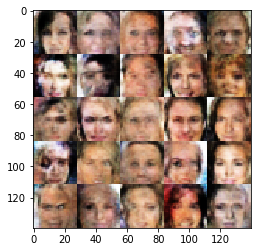

Epoch 1/1... Discriminator Loss: 1.5695... Generator Loss: 1.8323
Epoch 1/1... Discriminator Loss: 1.1207... Generator Loss: 0.6589
Epoch 1/1... Discriminator Loss: 1.1324... Generator Loss: 0.6559
Epoch 1/1... Discriminator Loss: 1.4861... Generator Loss: 0.3106
Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 0.9638
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 1.2284
Epoch 1/1... Discriminator Loss: 1.0761... Generator Loss: 1.3845
Epoch 1/1... Discriminator Loss: 1.3279... Generator Loss: 0.4296
Epoch 1/1... Discriminator Loss: 1.7949... Generator Loss: 0.1984
Epoch 1/1... Discriminator Loss: 1.0996... Generator Loss: 1.3348


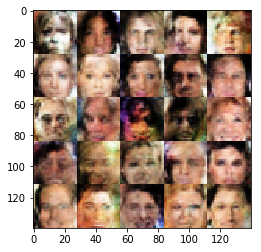

Epoch 1/1... Discriminator Loss: 1.0590... Generator Loss: 1.3255
Epoch 1/1... Discriminator Loss: 1.0928... Generator Loss: 0.7537
Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.4029
Epoch 1/1... Discriminator Loss: 1.0487... Generator Loss: 0.9082
Epoch 1/1... Discriminator Loss: 1.0034... Generator Loss: 1.2487
Epoch 1/1... Discriminator Loss: 1.6487... Generator Loss: 0.2503
Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 2.0047
Epoch 1/1... Discriminator Loss: 1.0237... Generator Loss: 1.3270
Epoch 1/1... Discriminator Loss: 1.1449... Generator Loss: 1.8371
Epoch 1/1... Discriminator Loss: 1.0444... Generator Loss: 1.5383


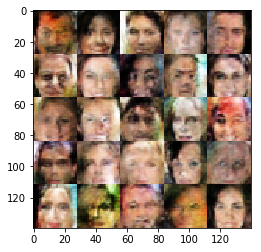

Epoch 1/1... Discriminator Loss: 1.0354... Generator Loss: 0.9969
Epoch 1/1... Discriminator Loss: 1.1560... Generator Loss: 0.6651
Epoch 1/1... Discriminator Loss: 1.5733... Generator Loss: 0.2696
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.4472
Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 0.3653
Epoch 1/1... Discriminator Loss: 1.0116... Generator Loss: 1.1982
Epoch 1/1... Discriminator Loss: 1.1739... Generator Loss: 0.5742
Epoch 1/1... Discriminator Loss: 1.1330... Generator Loss: 0.6730
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 1.2333
Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 0.6566


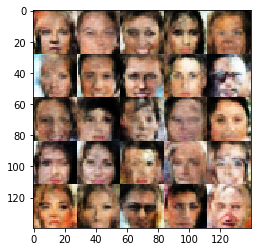

Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.1929... Generator Loss: 0.5661
Epoch 1/1... Discriminator Loss: 1.2503... Generator Loss: 0.5061
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 2.1871
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 1.4394
Epoch 1/1... Discriminator Loss: 1.4188... Generator Loss: 1.3087
Epoch 1/1... Discriminator Loss: 1.1334... Generator Loss: 0.6424
Epoch 1/1... Discriminator Loss: 1.4850... Generator Loss: 0.3200
Epoch 1/1... Discriminator Loss: 1.0339... Generator Loss: 1.1997
Epoch 1/1... Discriminator Loss: 1.6765... Generator Loss: 0.2324


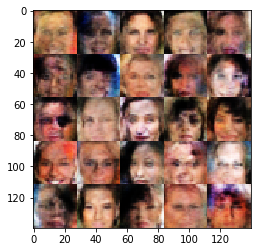

Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 1.0417... Generator Loss: 1.0545
Epoch 1/1... Discriminator Loss: 1.7207... Generator Loss: 0.2213
Epoch 1/1... Discriminator Loss: 1.6469... Generator Loss: 0.2488
Epoch 1/1... Discriminator Loss: 1.2221... Generator Loss: 0.5226
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 1.7385
Epoch 1/1... Discriminator Loss: 1.1695... Generator Loss: 1.5187
Epoch 1/1... Discriminator Loss: 1.0753... Generator Loss: 1.2976
Epoch 1/1... Discriminator Loss: 1.0194... Generator Loss: 1.2263
Epoch 1/1... Discriminator Loss: 1.0376... Generator Loss: 0.9040


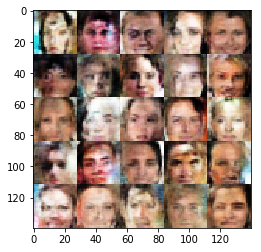

Epoch 1/1... Discriminator Loss: 1.1104... Generator Loss: 1.6433
Epoch 1/1... Discriminator Loss: 1.0684... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 1.7903... Generator Loss: 0.1953
Epoch 1/1... Discriminator Loss: 1.0688... Generator Loss: 1.3815
Epoch 1/1... Discriminator Loss: 1.2804... Generator Loss: 1.3864
Epoch 1/1... Discriminator Loss: 1.0706... Generator Loss: 0.9430
Epoch 1/1... Discriminator Loss: 1.0222... Generator Loss: 1.1259
Epoch 1/1... Discriminator Loss: 1.0524... Generator Loss: 1.6535
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 1.6037
Epoch 1/1... Discriminator Loss: 1.1293... Generator Loss: 1.8005


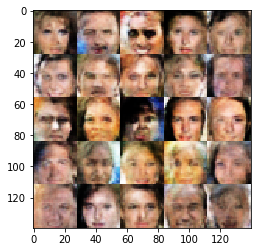

Epoch 1/1... Discriminator Loss: 1.3198... Generator Loss: 1.0873
Epoch 1/1... Discriminator Loss: 1.0889... Generator Loss: 0.7856
Epoch 1/1... Discriminator Loss: 1.1603... Generator Loss: 0.6117
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.5208
Epoch 1/1... Discriminator Loss: 1.4845... Generator Loss: 1.4668
Epoch 1/1... Discriminator Loss: 1.0771... Generator Loss: 1.5189
Epoch 1/1... Discriminator Loss: 1.1000... Generator Loss: 1.5769
Epoch 1/1... Discriminator Loss: 1.0396... Generator Loss: 1.1415
Epoch 1/1... Discriminator Loss: 1.0224... Generator Loss: 1.1582
Epoch 1/1... Discriminator Loss: 1.0340... Generator Loss: 1.1087


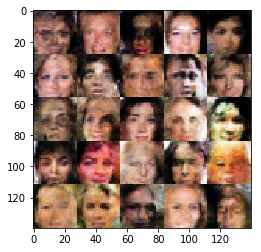

Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 0.5818
Epoch 1/1... Discriminator Loss: 1.0944... Generator Loss: 0.7554
Epoch 1/1... Discriminator Loss: 1.1698... Generator Loss: 1.3410
Epoch 1/1... Discriminator Loss: 1.0535... Generator Loss: 0.8466
Epoch 1/1... Discriminator Loss: 1.1789... Generator Loss: 2.1302
Epoch 1/1... Discriminator Loss: 1.7015... Generator Loss: 0.2366
Epoch 1/1... Discriminator Loss: 1.0759... Generator Loss: 1.3266
Epoch 1/1... Discriminator Loss: 1.7152... Generator Loss: 0.2188
Epoch 1/1... Discriminator Loss: 1.1013... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.2104... Generator Loss: 2.0695


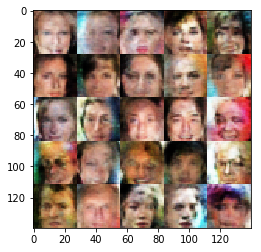

Epoch 1/1... Discriminator Loss: 1.0922... Generator Loss: 1.5971
Epoch 1/1... Discriminator Loss: 1.2907... Generator Loss: 2.4359
Epoch 1/1... Discriminator Loss: 1.3578... Generator Loss: 1.4776
Epoch 1/1... Discriminator Loss: 1.0970... Generator Loss: 1.7228
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 1.4731
Epoch 1/1... Discriminator Loss: 1.0736... Generator Loss: 1.3975
Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.2754... Generator Loss: 0.4592
Epoch 1/1... Discriminator Loss: 1.0901... Generator Loss: 1.8019
Epoch 1/1... Discriminator Loss: 1.1712... Generator Loss: 1.6594


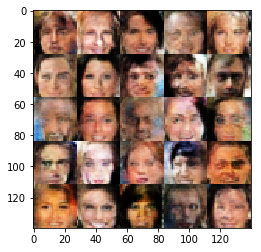

Epoch 1/1... Discriminator Loss: 1.1796... Generator Loss: 1.6867
Epoch 1/1... Discriminator Loss: 1.1202... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.1611... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.0092... Generator Loss: 1.0484
Epoch 1/1... Discriminator Loss: 1.2610... Generator Loss: 1.5825
Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 1.2094
Epoch 1/1... Discriminator Loss: 1.3312... Generator Loss: 1.6817
Epoch 1/1... Discriminator Loss: 1.1841... Generator Loss: 0.5647
Epoch 1/1... Discriminator Loss: 1.0340... Generator Loss: 1.4362
Epoch 1/1... Discriminator Loss: 1.3286... Generator Loss: 0.4125


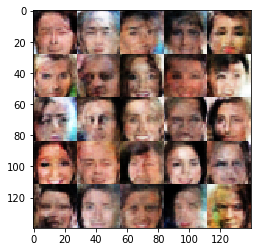

Epoch 1/1... Discriminator Loss: 1.0457... Generator Loss: 0.9486
Epoch 1/1... Discriminator Loss: 1.1534... Generator Loss: 0.6281
Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 0.6666
Epoch 1/1... Discriminator Loss: 1.5880... Generator Loss: 0.2640
Epoch 1/1... Discriminator Loss: 1.0423... Generator Loss: 1.4760
Epoch 1/1... Discriminator Loss: 1.5249... Generator Loss: 1.9002
Epoch 1/1... Discriminator Loss: 1.0900... Generator Loss: 0.8544
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.3922
Epoch 1/1... Discriminator Loss: 1.0655... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 1.1019... Generator Loss: 1.1924


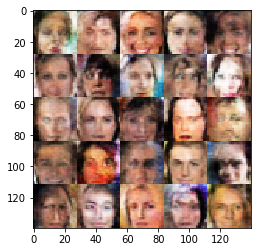

Epoch 1/1... Discriminator Loss: 1.0136... Generator Loss: 1.1450
Epoch 1/1... Discriminator Loss: 1.1765... Generator Loss: 1.7199
Epoch 1/1... Discriminator Loss: 1.5901... Generator Loss: 0.2705
Epoch 1/1... Discriminator Loss: 1.4554... Generator Loss: 0.3309
Epoch 1/1... Discriminator Loss: 1.0851... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.0430... Generator Loss: 0.9059
Epoch 1/1... Discriminator Loss: 1.0979... Generator Loss: 1.5573
Epoch 1/1... Discriminator Loss: 1.0669... Generator Loss: 0.8484
Epoch 1/1... Discriminator Loss: 1.0744... Generator Loss: 1.3767
Epoch 1/1... Discriminator Loss: 1.4962... Generator Loss: 1.2965


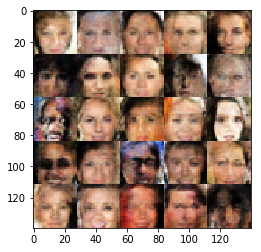

Epoch 1/1... Discriminator Loss: 1.1625... Generator Loss: 2.0148
Epoch 1/1... Discriminator Loss: 1.4190... Generator Loss: 0.3781
Epoch 1/1... Discriminator Loss: 1.8176... Generator Loss: 0.2082
Epoch 1/1... Discriminator Loss: 1.0534... Generator Loss: 1.1324
Epoch 1/1... Discriminator Loss: 1.7708... Generator Loss: 0.2095
Epoch 1/1... Discriminator Loss: 1.0240... Generator Loss: 1.0911
Epoch 1/1... Discriminator Loss: 2.0251... Generator Loss: 0.1702
Epoch 1/1... Discriminator Loss: 1.0333... Generator Loss: 1.1536
Epoch 1/1... Discriminator Loss: 1.0442... Generator Loss: 1.1829
Epoch 1/1... Discriminator Loss: 1.0305... Generator Loss: 1.2550


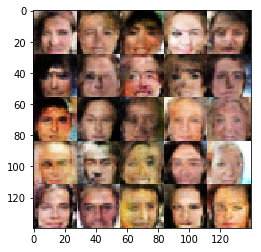

Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 1.5070
Epoch 1/1... Discriminator Loss: 1.0109... Generator Loss: 1.1892
Epoch 1/1... Discriminator Loss: 1.0334... Generator Loss: 0.9666
Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 1.7526
Epoch 1/1... Discriminator Loss: 1.2801... Generator Loss: 0.4940
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.4393
Epoch 1/1... Discriminator Loss: 1.0417... Generator Loss: 1.1912
Epoch 1/1... Discriminator Loss: 1.1834... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 1.0533... Generator Loss: 1.2682
Epoch 1/1... Discriminator Loss: 1.0316... Generator Loss: 1.3021


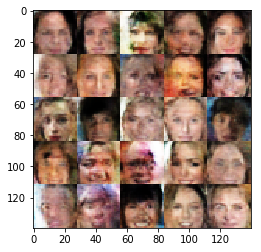

Epoch 1/1... Discriminator Loss: 1.6382... Generator Loss: 0.2333
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.7528
Epoch 1/1... Discriminator Loss: 1.0735... Generator Loss: 1.3836
Epoch 1/1... Discriminator Loss: 1.0515... Generator Loss: 0.8807
Epoch 1/1... Discriminator Loss: 1.7256... Generator Loss: 0.2126
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 1.6506
Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 1.4891
Epoch 1/1... Discriminator Loss: 1.0894... Generator Loss: 1.1425
Epoch 1/1... Discriminator Loss: 1.6191... Generator Loss: 0.2570
Epoch 1/1... Discriminator Loss: 1.5956... Generator Loss: 0.2674


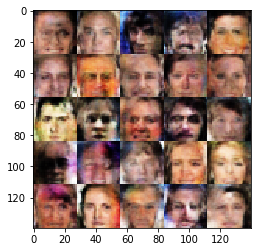

Epoch 1/1... Discriminator Loss: 1.3209... Generator Loss: 1.2627
Epoch 1/1... Discriminator Loss: 1.2246... Generator Loss: 2.0554
Epoch 1/1... Discriminator Loss: 1.0774... Generator Loss: 1.1307
Epoch 1/1... Discriminator Loss: 1.1039... Generator Loss: 1.2981
Epoch 1/1... Discriminator Loss: 1.1375... Generator Loss: 1.5225
Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 1.6812
Epoch 1/1... Discriminator Loss: 1.1005... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 1.0286... Generator Loss: 1.0843
Epoch 1/1... Discriminator Loss: 1.3198... Generator Loss: 2.1147
Epoch 1/1... Discriminator Loss: 1.1657... Generator Loss: 1.4049


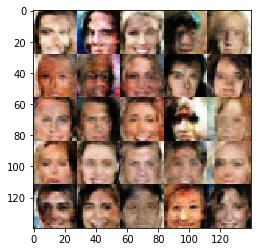

Epoch 1/1... Discriminator Loss: 1.2389... Generator Loss: 0.5160
Epoch 1/1... Discriminator Loss: 1.4681... Generator Loss: 0.3162
Epoch 1/1... Discriminator Loss: 1.2248... Generator Loss: 0.5067
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 1.6006
Epoch 1/1... Discriminator Loss: 1.1065... Generator Loss: 1.8142
Epoch 1/1... Discriminator Loss: 1.1803... Generator Loss: 1.6943
Epoch 1/1... Discriminator Loss: 1.0950... Generator Loss: 0.9882
Epoch 1/1... Discriminator Loss: 1.5213... Generator Loss: 0.2963
Epoch 1/1... Discriminator Loss: 1.0273... Generator Loss: 1.3402
Epoch 1/1... Discriminator Loss: 1.2011... Generator Loss: 0.5522


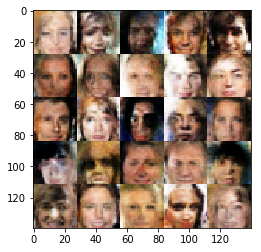

Epoch 1/1... Discriminator Loss: 1.0486... Generator Loss: 0.8931
Epoch 1/1... Discriminator Loss: 1.1771... Generator Loss: 2.0304
Epoch 1/1... Discriminator Loss: 1.4124... Generator Loss: 1.3029
Epoch 1/1... Discriminator Loss: 1.0325... Generator Loss: 1.0057
Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 0.4445
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.4400
Epoch 1/1... Discriminator Loss: 1.0580... Generator Loss: 0.8578
Epoch 1/1... Discriminator Loss: 1.1507... Generator Loss: 1.2846
Epoch 1/1... Discriminator Loss: 1.0490... Generator Loss: 1.2835
Epoch 1/1... Discriminator Loss: 1.0359... Generator Loss: 0.9783


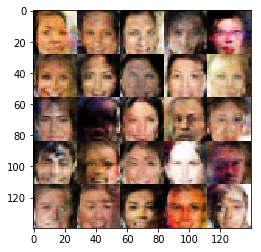

Epoch 1/1... Discriminator Loss: 1.1955... Generator Loss: 1.9742
Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 2.0409
Epoch 1/1... Discriminator Loss: 1.0603... Generator Loss: 1.5780
Epoch 1/1... Discriminator Loss: 1.0491... Generator Loss: 1.0661
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.3578
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.0600... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.4671
Epoch 1/1... Discriminator Loss: 1.4858... Generator Loss: 0.3089
Epoch 1/1... Discriminator Loss: 1.0990... Generator Loss: 1.4667


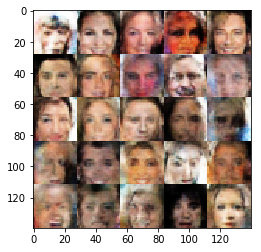

Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.3961
Epoch 1/1... Discriminator Loss: 1.4064... Generator Loss: 0.3674
Epoch 1/1... Discriminator Loss: 1.0344... Generator Loss: 0.9798
Epoch 1/1... Discriminator Loss: 1.0805... Generator Loss: 1.3941
Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 1.5398
Epoch 1/1... Discriminator Loss: 1.1388... Generator Loss: 0.6306
Epoch 1/1... Discriminator Loss: 1.1332... Generator Loss: 0.6375
Epoch 1/1... Discriminator Loss: 1.8637... Generator Loss: 0.1868
Epoch 1/1... Discriminator Loss: 1.1582... Generator Loss: 0.6243
Epoch 1/1... Discriminator Loss: 1.0190... Generator Loss: 1.1526


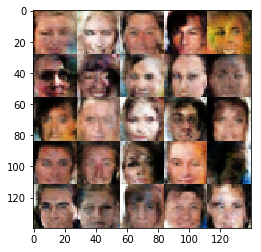

Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 1.8917
Epoch 1/1... Discriminator Loss: 1.0764... Generator Loss: 1.7171
Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 1.1547
Epoch 1/1... Discriminator Loss: 1.2148... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 1.0631... Generator Loss: 0.8496
Epoch 1/1... Discriminator Loss: 1.1137... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 1.0354... Generator Loss: 1.1857
Epoch 1/1... Discriminator Loss: 1.1345... Generator Loss: 2.1187
Epoch 1/1... Discriminator Loss: 1.5093... Generator Loss: 1.3568
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 1.5361


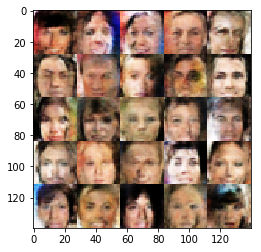

Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 1.1001
Epoch 1/1... Discriminator Loss: 1.0239... Generator Loss: 1.3571
Epoch 1/1... Discriminator Loss: 1.1121... Generator Loss: 0.7027
Epoch 1/1... Discriminator Loss: 1.6024... Generator Loss: 0.2502
Epoch 1/1... Discriminator Loss: 2.0285... Generator Loss: 0.1787
Epoch 1/1... Discriminator Loss: 1.0712... Generator Loss: 0.8315
Epoch 1/1... Discriminator Loss: 1.0888... Generator Loss: 0.7498
Epoch 1/1... Discriminator Loss: 1.0494... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 1.0291... Generator Loss: 0.9569
Epoch 1/1... Discriminator Loss: 1.0467... Generator Loss: 0.8784


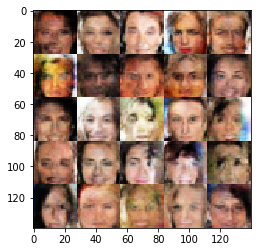

Epoch 1/1... Discriminator Loss: 1.0494... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.0968... Generator Loss: 1.7649
Epoch 1/1... Discriminator Loss: 1.2023... Generator Loss: 1.9822
Epoch 1/1... Discriminator Loss: 1.0246... Generator Loss: 1.0604
Epoch 1/1... Discriminator Loss: 1.0124... Generator Loss: 1.3719
Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 1.9565
Epoch 1/1... Discriminator Loss: 1.0860... Generator Loss: 1.2390
Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 1.4152
Epoch 1/1... Discriminator Loss: 1.0340... Generator Loss: 1.4415
Epoch 1/1... Discriminator Loss: 1.0262... Generator Loss: 1.2251


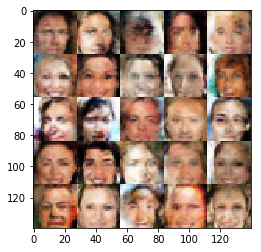

Epoch 1/1... Discriminator Loss: 1.2851... Generator Loss: 0.4589
Epoch 1/1... Discriminator Loss: 1.0363... Generator Loss: 1.0105
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.5603
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 1.1180
Epoch 1/1... Discriminator Loss: 1.1222... Generator Loss: 1.5384
Epoch 1/1... Discriminator Loss: 1.1139... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.0352... Generator Loss: 1.1092
Epoch 1/1... Discriminator Loss: 1.0216... Generator Loss: 0.9993
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 1.9690
Epoch 1/1... Discriminator Loss: 1.7739... Generator Loss: 0.2274


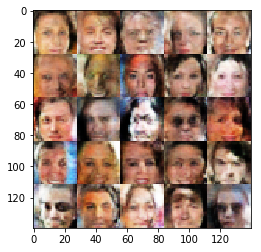

Epoch 1/1... Discriminator Loss: 1.0487... Generator Loss: 0.9866
Epoch 1/1... Discriminator Loss: 1.0792... Generator Loss: 1.6389
Epoch 1/1... Discriminator Loss: 1.1135... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.0536... Generator Loss: 1.3015
Epoch 1/1... Discriminator Loss: 1.1987... Generator Loss: 1.7827
Epoch 1/1... Discriminator Loss: 1.1657... Generator Loss: 1.5540
Epoch 1/1... Discriminator Loss: 1.0283... Generator Loss: 1.0738
Epoch 1/1... Discriminator Loss: 1.0365... Generator Loss: 1.3398
Epoch 1/1... Discriminator Loss: 1.0218... Generator Loss: 1.2349
Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 1.5973


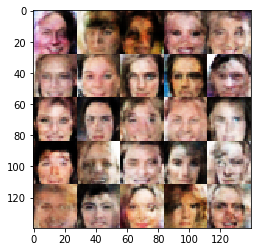

Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 1.7664
Epoch 1/1... Discriminator Loss: 1.1379... Generator Loss: 1.7487
Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 1.2565
Epoch 1/1... Discriminator Loss: 1.4561... Generator Loss: 0.3217
Epoch 1/1... Discriminator Loss: 1.3140... Generator Loss: 0.4219
Epoch 1/1... Discriminator Loss: 1.0531... Generator Loss: 0.8652
Epoch 1/1... Discriminator Loss: 1.0905... Generator Loss: 1.0587
Epoch 1/1... Discriminator Loss: 1.0412... Generator Loss: 1.0145
Epoch 1/1... Discriminator Loss: 1.0264... Generator Loss: 1.4478
Epoch 1/1... Discriminator Loss: 1.0331... Generator Loss: 1.3737


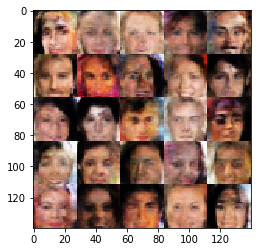

Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.5051
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.4467
Epoch 1/1... Discriminator Loss: 1.0246... Generator Loss: 1.4315
Epoch 1/1... Discriminator Loss: 1.0519... Generator Loss: 0.8650
Epoch 1/1... Discriminator Loss: 1.1983... Generator Loss: 0.5674
Epoch 1/1... Discriminator Loss: 1.0330... Generator Loss: 1.4608
Epoch 1/1... Discriminator Loss: 1.0299... Generator Loss: 1.1036
Epoch 1/1... Discriminator Loss: 1.0581... Generator Loss: 1.6976
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 1.7791
Epoch 1/1... Discriminator Loss: 1.1736... Generator Loss: 1.6749


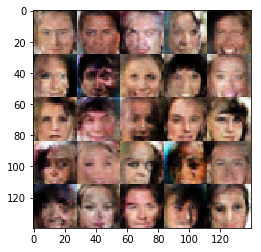

Epoch 1/1... Discriminator Loss: 1.0167... Generator Loss: 1.0695
Epoch 1/1... Discriminator Loss: 1.0060... Generator Loss: 1.3757
Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.3900
Epoch 1/1... Discriminator Loss: 1.0497... Generator Loss: 1.7758
Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.6606
Epoch 1/1... Discriminator Loss: 1.1280... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.7308... Generator Loss: 0.2214
Epoch 1/1... Discriminator Loss: 1.2901... Generator Loss: 0.4590
Epoch 1/1... Discriminator Loss: 1.0206... Generator Loss: 1.4595
Epoch 1/1... Discriminator Loss: 1.1512... Generator Loss: 0.6170


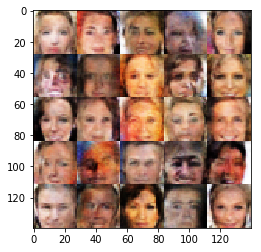

Epoch 1/1... Discriminator Loss: 1.2668... Generator Loss: 1.7130
Epoch 1/1... Discriminator Loss: 1.0605... Generator Loss: 1.2536
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 0.3809
Epoch 1/1... Discriminator Loss: 1.0635... Generator Loss: 0.7892
Epoch 1/1... Discriminator Loss: 1.0542... Generator Loss: 0.8950
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 1.3602
Epoch 1/1... Discriminator Loss: 1.0640... Generator Loss: 0.9629
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 0.9332
Epoch 1/1... Discriminator Loss: 1.1457... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.1084... Generator Loss: 1.0999


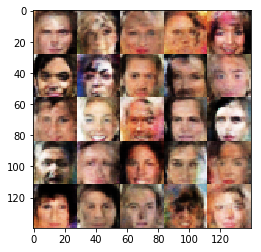

Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.5727... Generator Loss: 0.2975
Epoch 1/1... Discriminator Loss: 1.0296... Generator Loss: 0.9386
Epoch 1/1... Discriminator Loss: 1.1529... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 0.9725
Epoch 1/1... Discriminator Loss: 1.0286... Generator Loss: 1.3778
Epoch 1/1... Discriminator Loss: 1.0496... Generator Loss: 1.3121
Epoch 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.4293
Epoch 1/1... Discriminator Loss: 1.0486... Generator Loss: 0.8756
Epoch 1/1... Discriminator Loss: 1.0335... Generator Loss: 1.3601


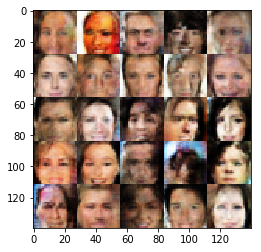

Epoch 1/1... Discriminator Loss: 1.0789... Generator Loss: 0.9793
Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 1.5868
Epoch 1/1... Discriminator Loss: 1.2407... Generator Loss: 2.0236
Epoch 1/1... Discriminator Loss: 1.2755... Generator Loss: 2.2289
Epoch 1/1... Discriminator Loss: 1.1288... Generator Loss: 1.3139
Epoch 1/1... Discriminator Loss: 1.0256... Generator Loss: 1.0729
Epoch 1/1... Discriminator Loss: 1.0256... Generator Loss: 1.1006
Epoch 1/1... Discriminator Loss: 1.2091... Generator Loss: 1.4584
Epoch 1/1... Discriminator Loss: 1.0180... Generator Loss: 1.1161
Epoch 1/1... Discriminator Loss: 1.0343... Generator Loss: 1.1440


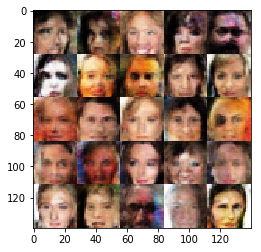

Epoch 1/1... Discriminator Loss: 1.0002... Generator Loss: 1.1291
Epoch 1/1... Discriminator Loss: 1.1766... Generator Loss: 1.0545


In [13]:
batch_size = 20
z_dim = 100
learning_rate = 0.001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.